In [1]:
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import math




In [2]:
from pylab import rcParams

rcParams['figure.figsize'] = 16, 16
%matplotlib inline

sns.set()

plt.rcParams['figure.dpi'] = 200

# Reading datasets

In [3]:
df_mari = pd.read_csv('mari.csv', index_col=0)
df_kabardians = pd.read_csv('kabardians.csv', index_col=0)
df_ossetians = pd.read_csv('ossetians.csv', index_col=0)
df_chuvash = pd.read_csv('chuvash.csv', index_col=0)

df_allele_frequences = pd.read_csv('allele_frequences.csv')
df_haplotypes_clopidrogel = pd.read_csv('haplotypes_clopidrogel.csv')
df_haplotypes_warfarin = pd.read_csv('haplotypes_warfarin.csv')

df_exp_obs_mari = pd.read_csv('expected_observed_mari.csv')
df_exp_obs_kabardians = pd.read_csv('expected_observed_kabardians.csv')
df_exp_obs_ossetians = pd.read_csv('expected_observed_ossetians.csv')
df_exp_obs_chuvash = pd.read_csv('expected_observed_chuvash.csv')

# Preprocessing

In [4]:
NATIONALITY = 'Nationality'

df_mari = df_mari[df_mari.columns[5:]]
df_mari.columns = [
    'SLCO1B1(T521C)',
    'CYP2C9*2(C430Т)',
    'CYP2C9*3(А1075C)',
    'CYP2C19*2(G681A)',
    'CYP2C19*3(G636A)',
    'CYP2C19*17(C806T)',
    'CYP2D6_4(G1846A)',
    'VKORC1(G1639A)',
    'ABCB1(C3435T)',
]
df_mari[NATIONALITY] = np.full(df_mari.shape[0], '1. mari')

df_chuvash = df_chuvash[df_chuvash.columns[5:]]
df_chuvash.columns = [
    'CYP2C19*2(G681A)',
    'CYP2C19*3(G636A)',
    'CYP2C19*17(C806T)',
    'ABCB1(C3435T)',
    'CYP2D6_4(G1846A)',
    'CYP3A5(A6986G)',
    'CYP2C9*2(C430Т)',
    'CYP2C9*3(А1075C)',
    'SLCO1B1(T521C)',
    'VKORC1(G1639A)',
]
df_chuvash[NATIONALITY] = np.full(df_chuvash.shape[0], '2. chuvash')

df_kabardians = df_kabardians[df_kabardians.columns[5:]]
df_kabardians.columns = [
    'ABCB1(C3435T)',
    'CYP2C9*2(C430Т)',
    'CYP2C9*3(А1075C)',
    'CYP2C19*2(G681A)',
    'CYP2C19*3(G636A)',
    'CYP2C19*17(C806T)',
    'CYP2D6_4(G1846A)',
    'VKORC1(G1639A)',
    'SLCO1B1(T521C)',
]
df_kabardians[NATIONALITY] = np.full(df_kabardians.shape[0], '3. kabardian')

df_ossetians = df_ossetians[df_ossetians.columns[5:]]
df_ossetians.columns = [
    'CYP2C9*2(C430Т)',
    'CYP2C9*3(А1075C)',
    'CYP2C19*2(G681A)',
    'CYP2C19*3(G636A)',
    'CYP2C19*17(C806T)',
    'CYP2D6_4(G1846A)',
    'ABCB1(C3435T)',
    'VKORC1(G1639A)',
    'SLCO1B1(T521C)',
]
df_ossetians[NATIONALITY] = np.full(df_ossetians.shape[0], '4. ossetian')


In [5]:
merged_df = pd.concat([
    df_mari,
    df_chuvash,
    df_kabardians,
    df_ossetians,
], axis=0).dropna(axis=1)

/Users/alexandershein/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: FutureWarning:

Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.




In [6]:
merged_df

,ABCB1(C3435T),CYP2C19*17(C806T),CYP2C19*2(G681A),CYP2C19*3(G636A),CYP2C9*2(C430Т),CYP2C9*3(А1075C),CYP2D6_4(G1846A),Nationality,SLCO1B1(T521C),VKORC1(G1639A)
№ образца,,,,,,,,,,
1,TT,CT,GG,GG,CC,AA,GG,1. mari,TT,AA
2,CT,CC,GG,GG,CT,AA,GG,1. mari,TT,GA
3,TT,CT,GA,GG,CC,AA,GA,1. mari,TT,GA
4,CT,CC,GG,GG,CC,CC,GG,1. mari,TT,AA
5,CT,TT,GG,GG,CC,AA,GG,1. mari,TT,GG
...,...,...,...,...,...,...,...,...,...,...
240,CT,CC,GG,GG,CC,AA,GA,4. ossetian,TT,AA
241,CT,CC,GG,GG,CC,AA,GG,4. ossetian,TT,GA
242,TT,CC,GG,GG,CC,AC,GG,4. ossetian,TT,GA


In [7]:
merged_df.columns

Index(['ABCB1(C3435T)', 'CYP2C19*17(C806T)', 'CYP2C19*2(G681A)',
       'CYP2C19*3(G636A)', 'CYP2C9*2(C430Т)', 'CYP2C9*3(А1075C)',
       'CYP2D6_4(G1846A)', 'Nationality', 'SLCO1B1(T521C)', 'VKORC1(G1639A)'],
      dtype='object')

# Creating plots using seaborn

## SNP Batplots without normalization

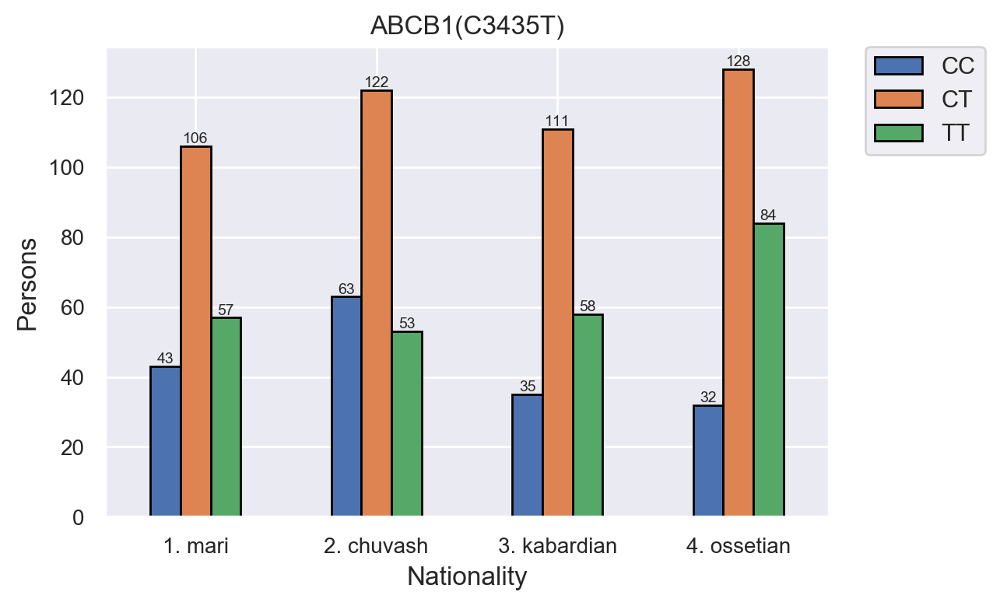

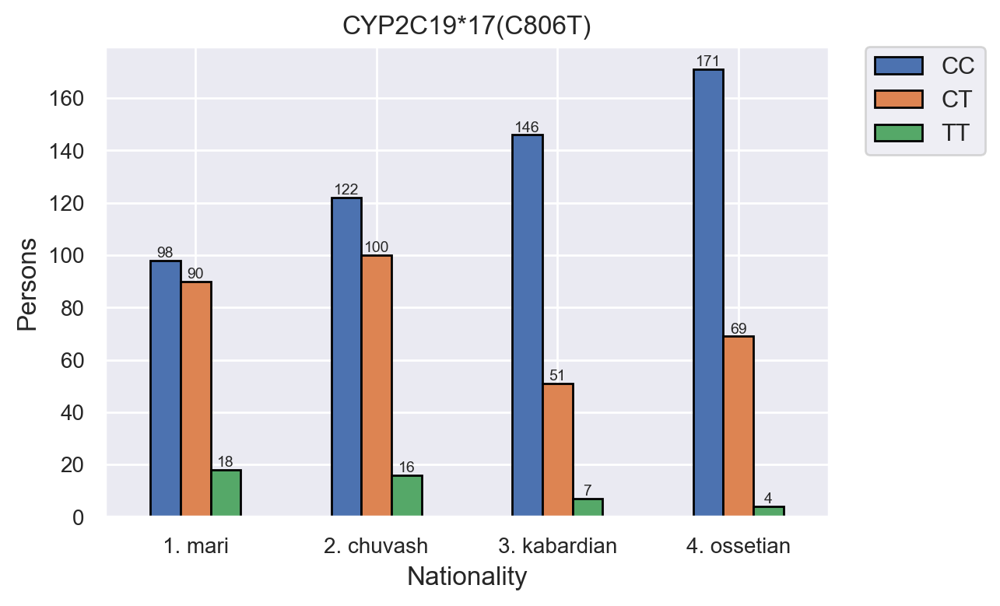

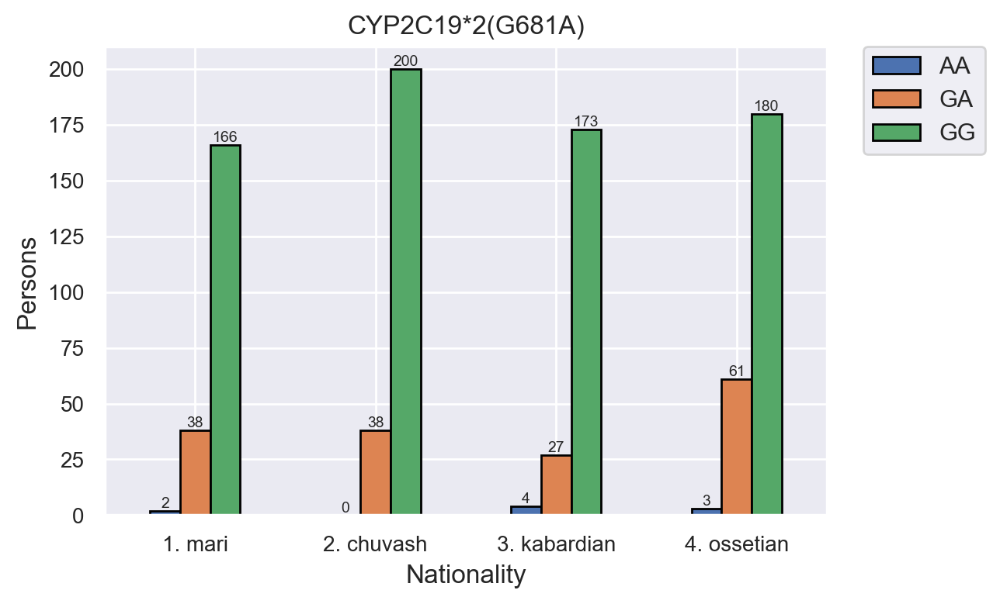

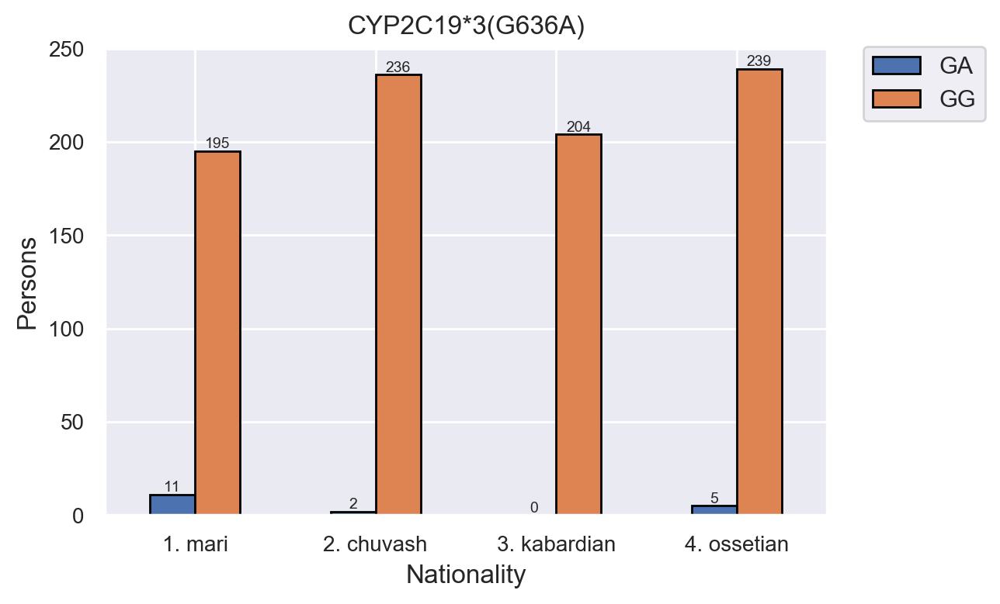

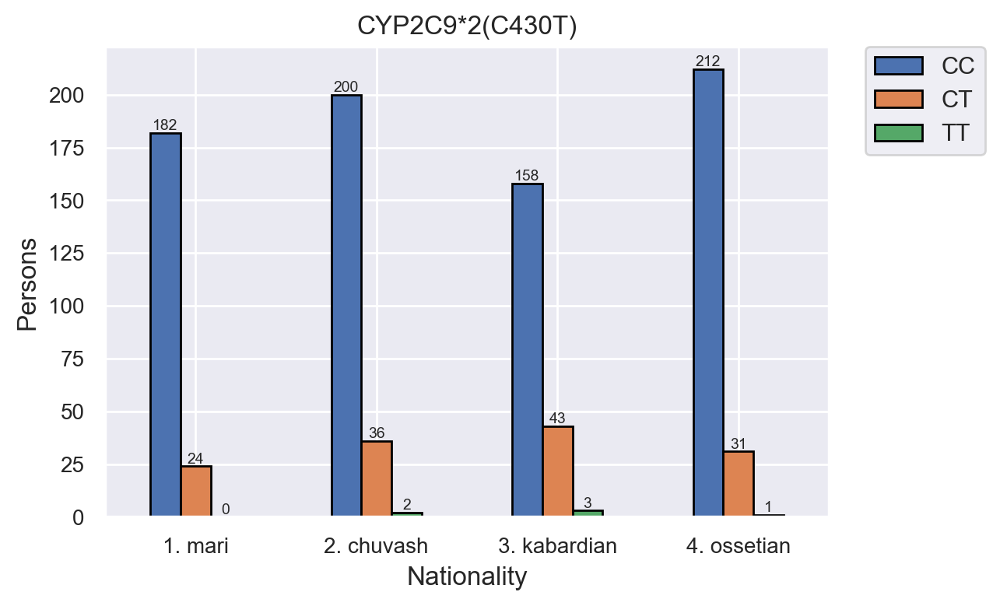

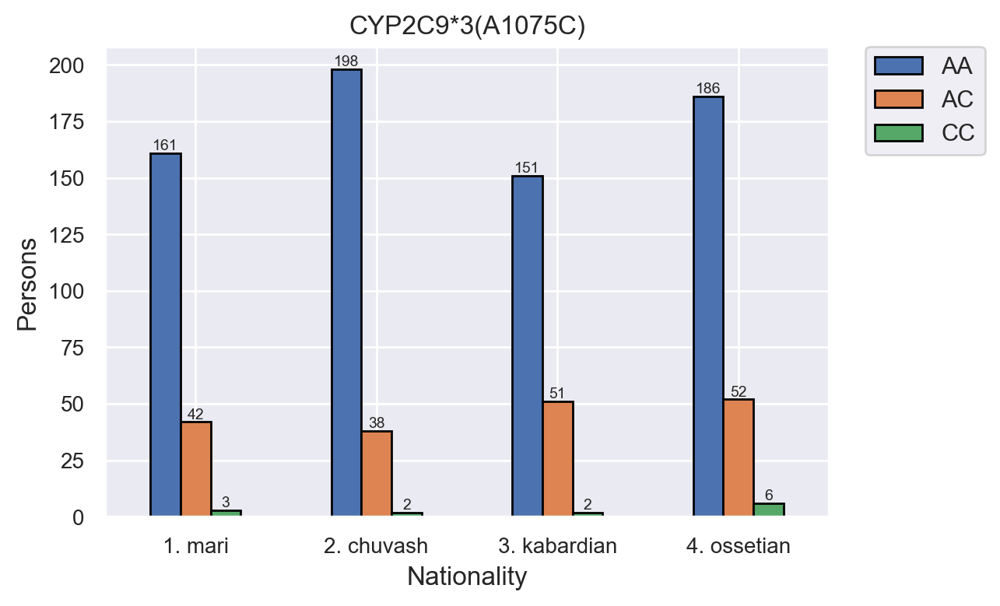

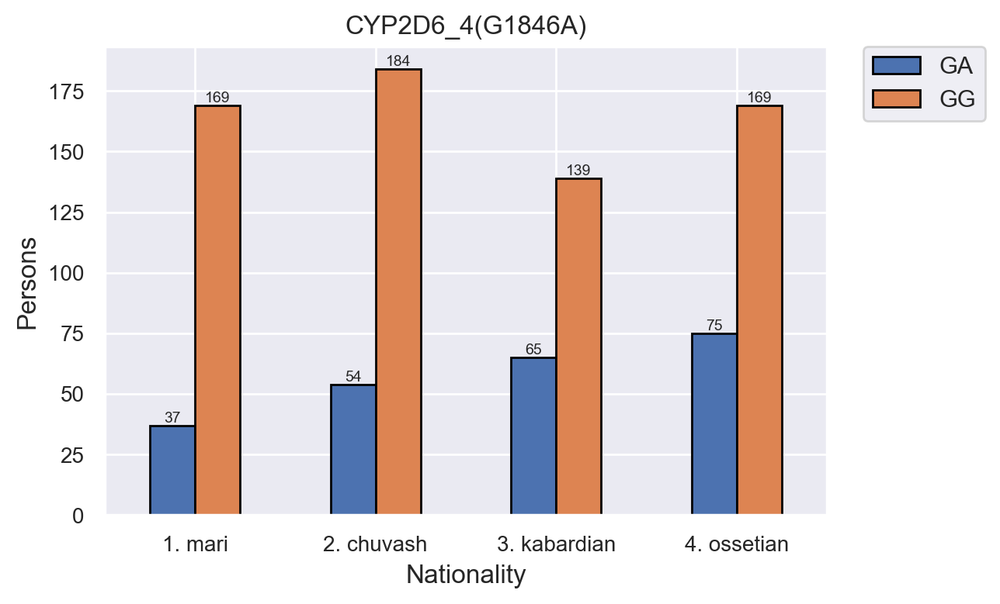

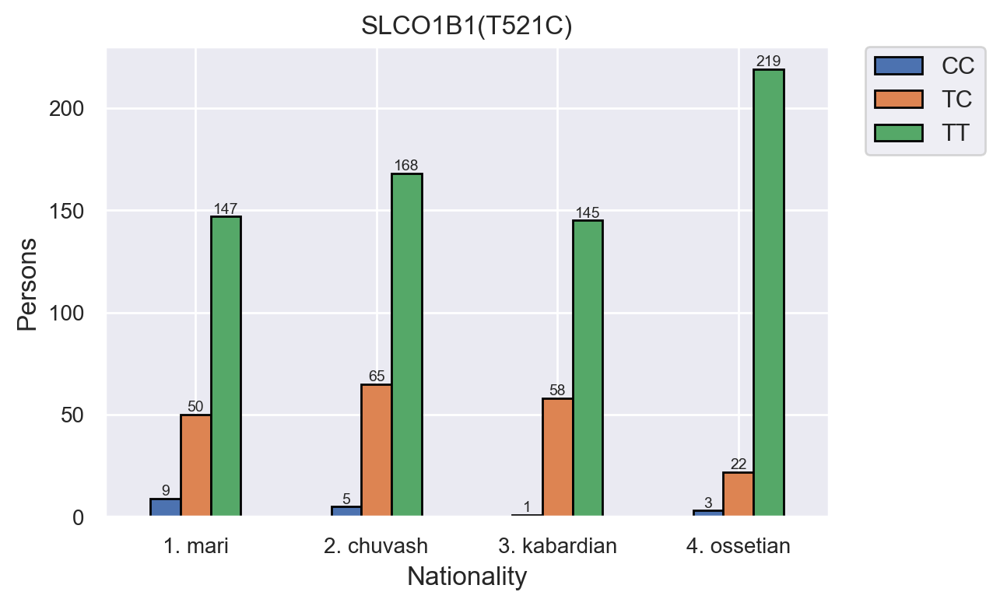

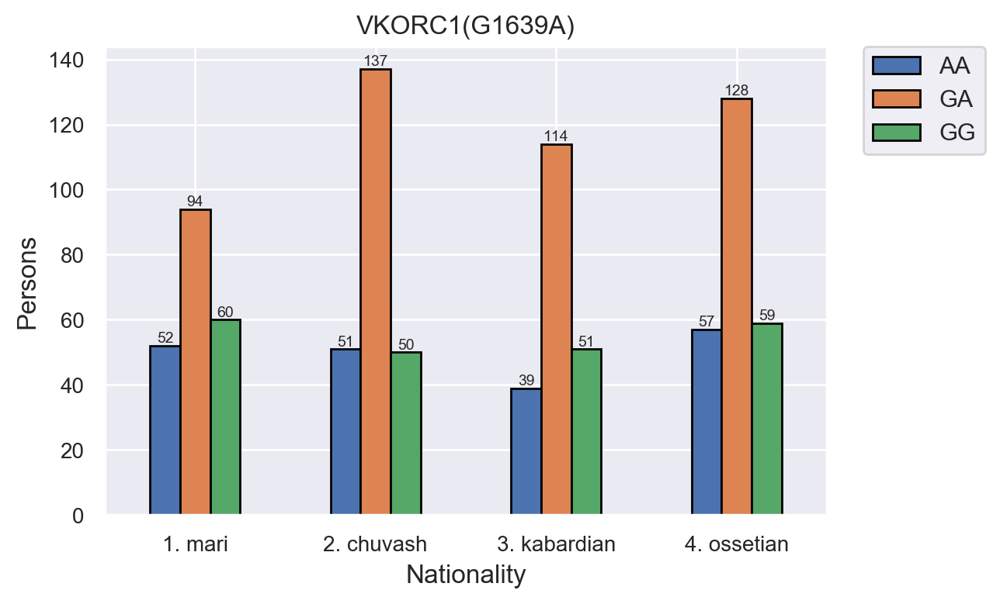

In [8]:
for col in merged_df.columns:
    if col != 'Nationality':
        gb = merged_df[[col, 'Nationality']].groupby(['Nationality', col]).size().unstack(fill_value=0)
        chart = gb.plot(kind='bar', fontsize=10, edgecolor='black')
        for patch in chart.patches:
            bbox = patch.get_bbox()
            val = "{:.0f}".format(bbox.y1 + bbox.y0)        
            chart.annotate(val, ((bbox.x0 + bbox.x1)/2, bbox.y1), ha='center', va='bottom', fontsize=7)
        plt.xticks(rotation=0)
        plt.title(col)
        plt.ylabel('Persons')
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

## SNP Batplots with normalization

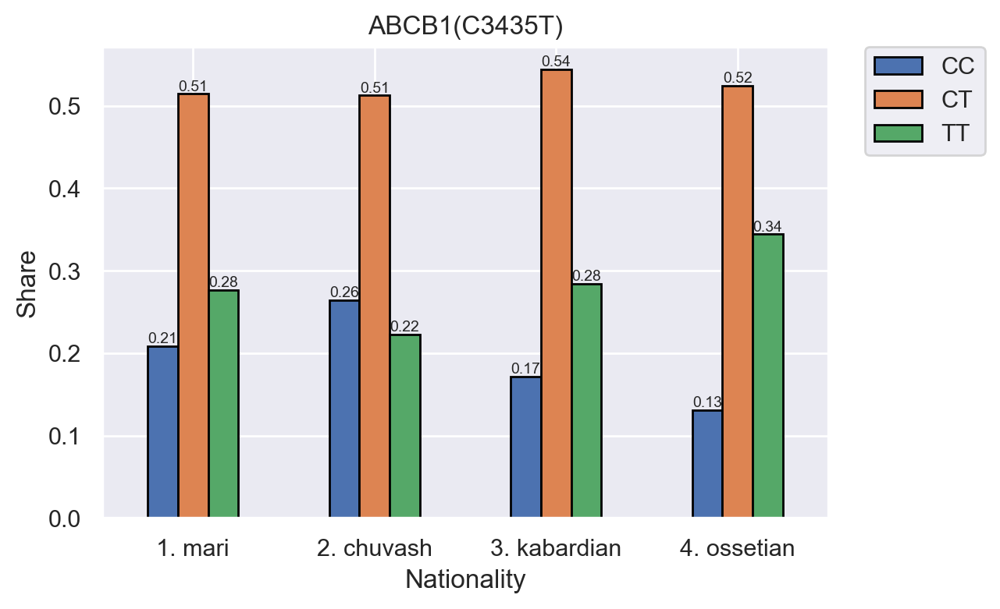

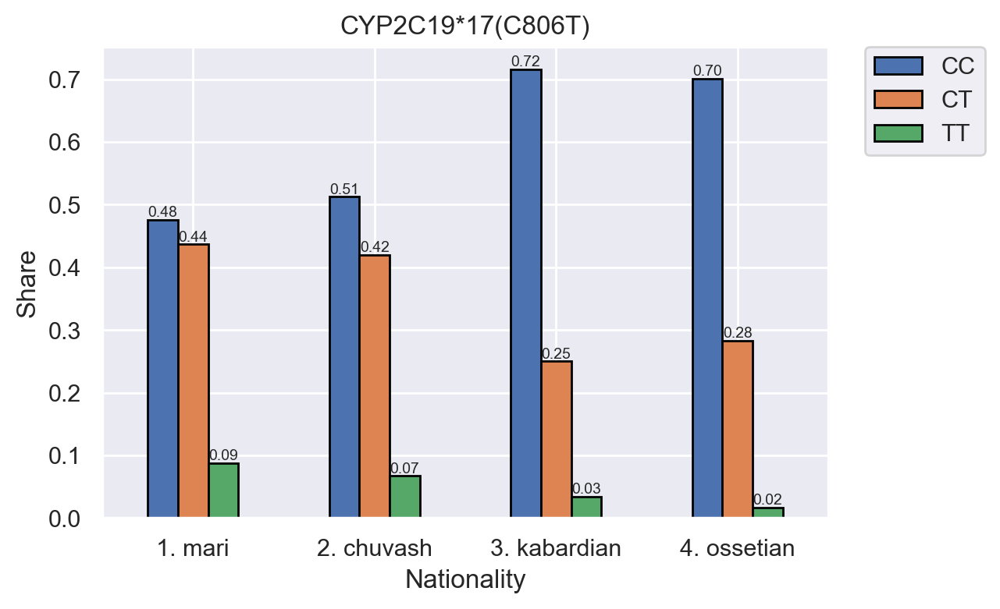

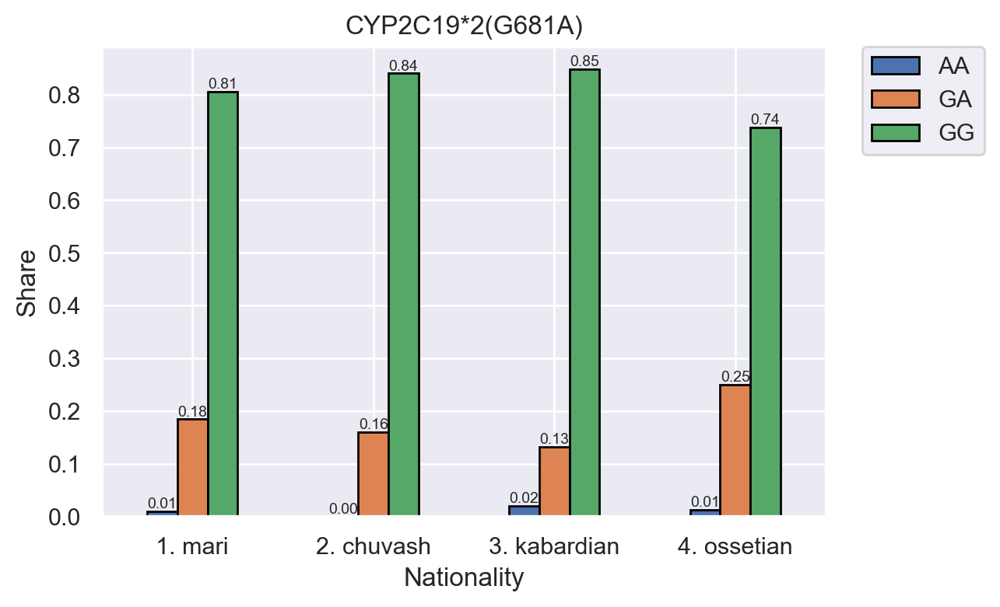

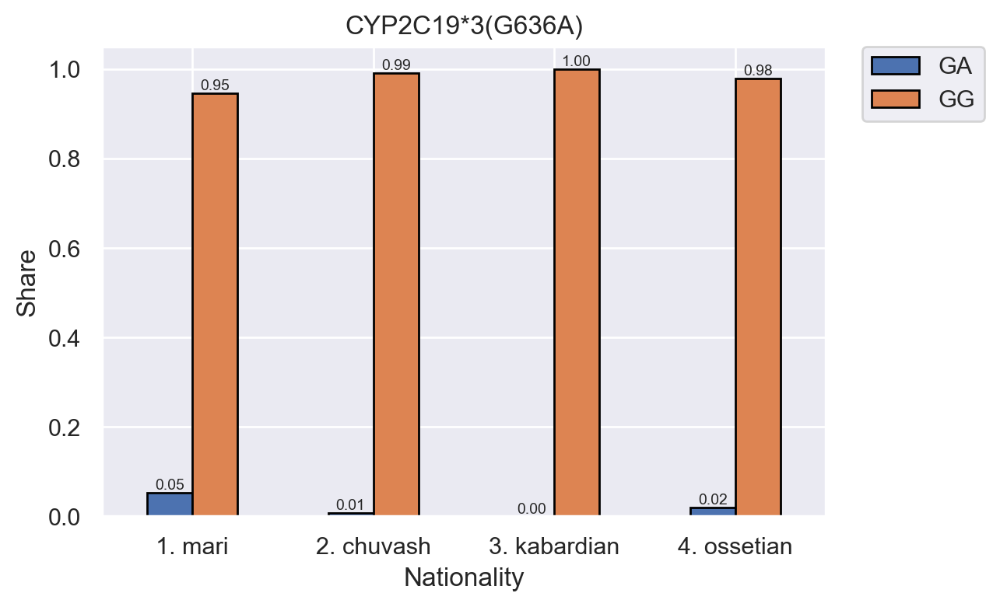

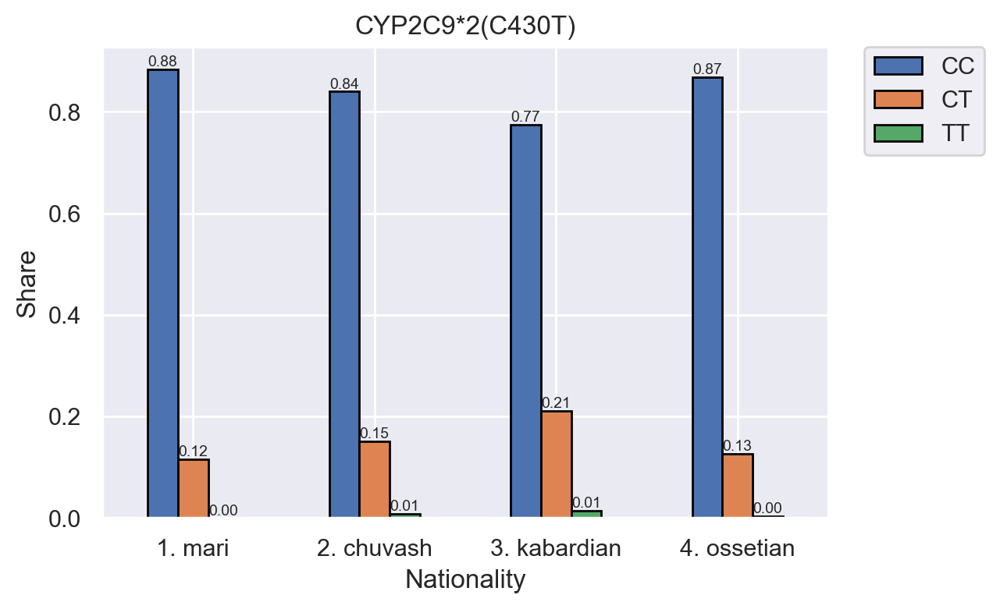

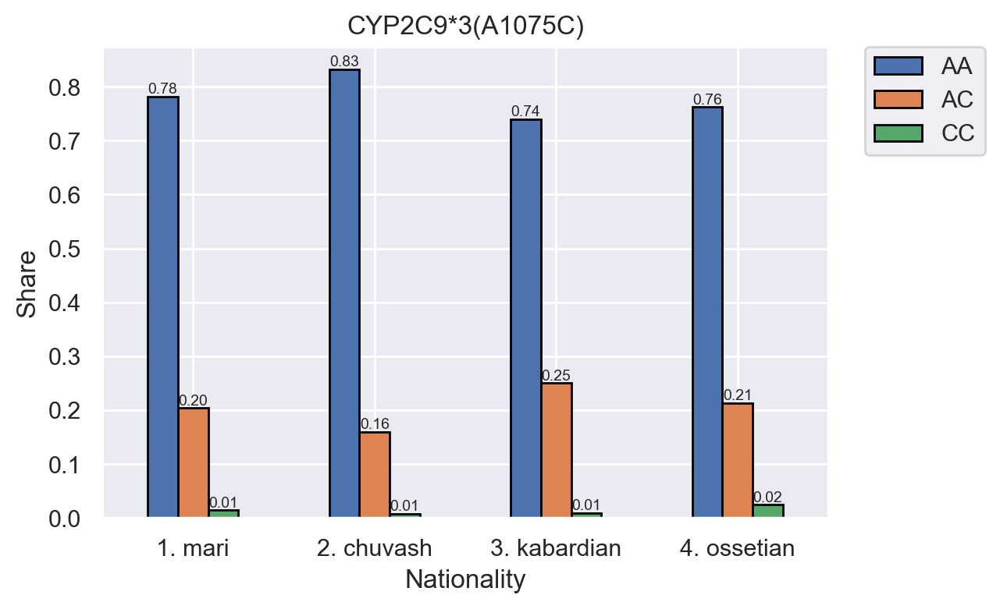

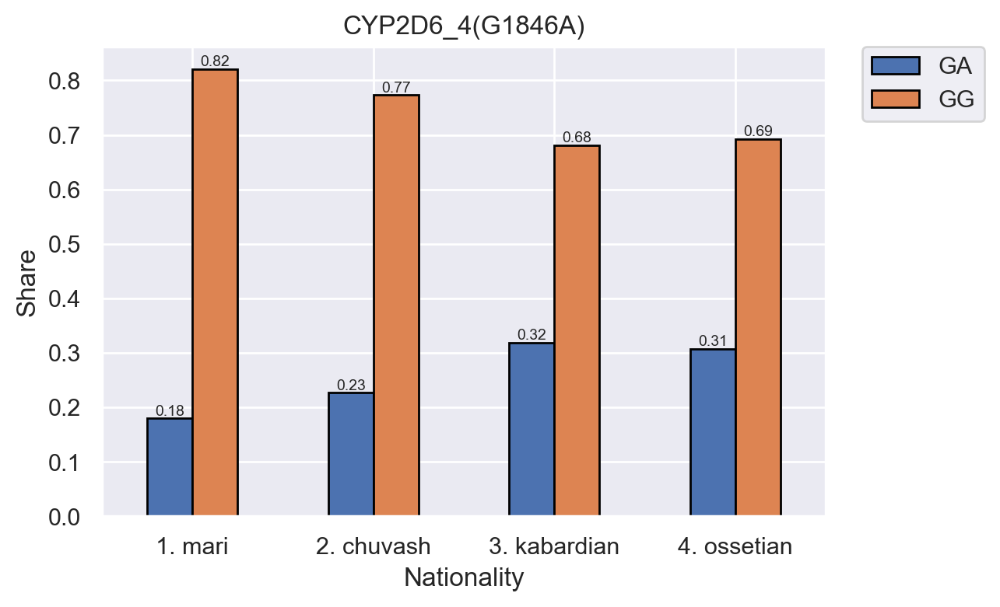

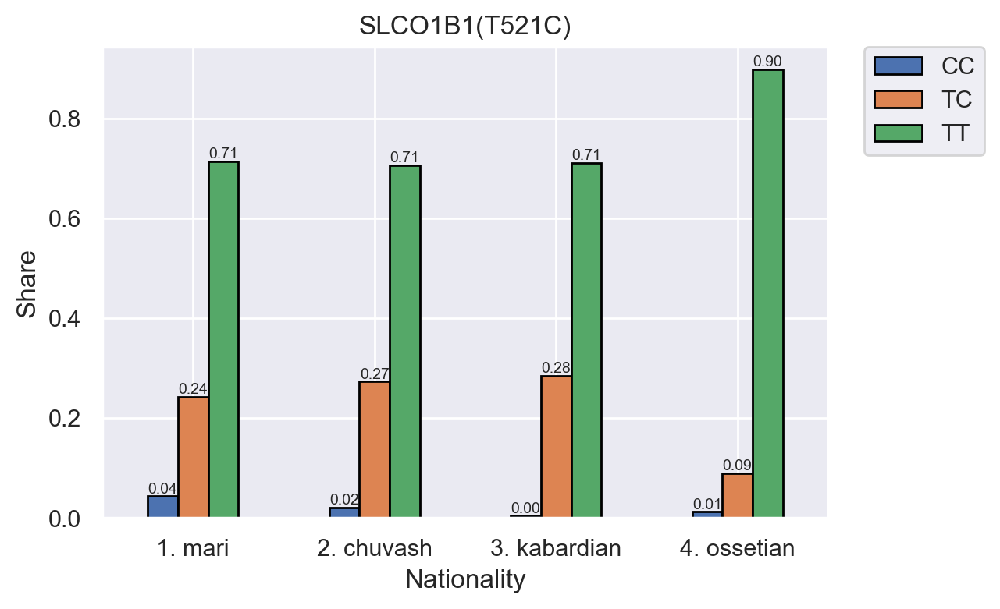

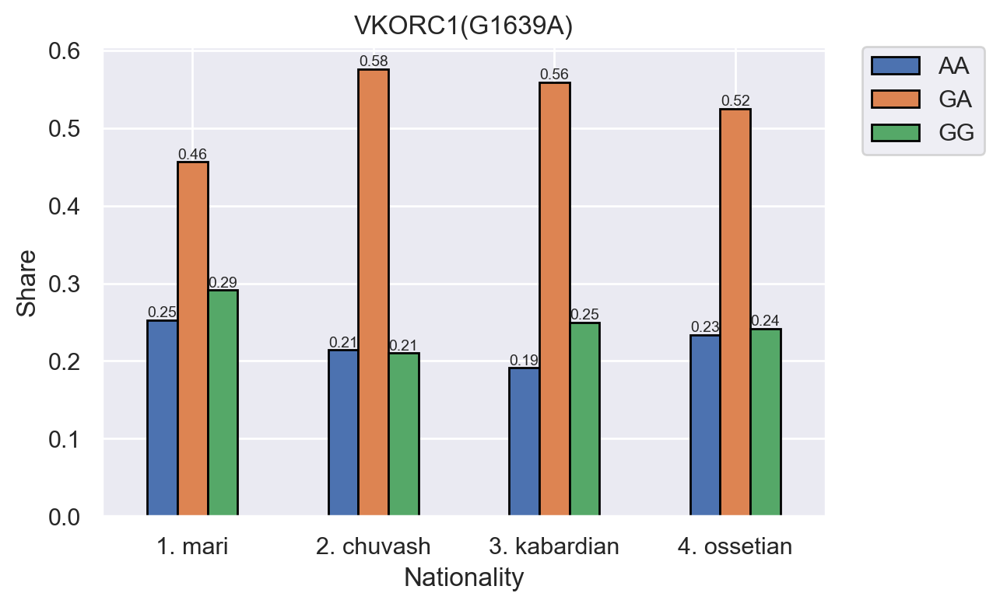

In [9]:
bars = []
for col in merged_df.columns:
    if col != 'Nationality':
        gb = merged_df[[col, 'Nationality']].groupby(['Nationality', col]).size().unstack(fill_value=0)
        chart = gb.divide(gb.sum(axis=1), axis=0).plot(kind='bar', edgecolor='black')
        for patch in chart.patches:
            bbox = patch.get_bbox()
            val = "{:.2f}".format(bbox.y1 + bbox.y0)        
            chart.annotate(val, ((bbox.x0 + bbox.x1)/2, bbox.y1), ha='center', va='bottom', fontsize=7)
        plt.xticks(rotation=0)
        plt.title(col)
        plt.ylabel('Share')
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

## Allele frequences without normalization

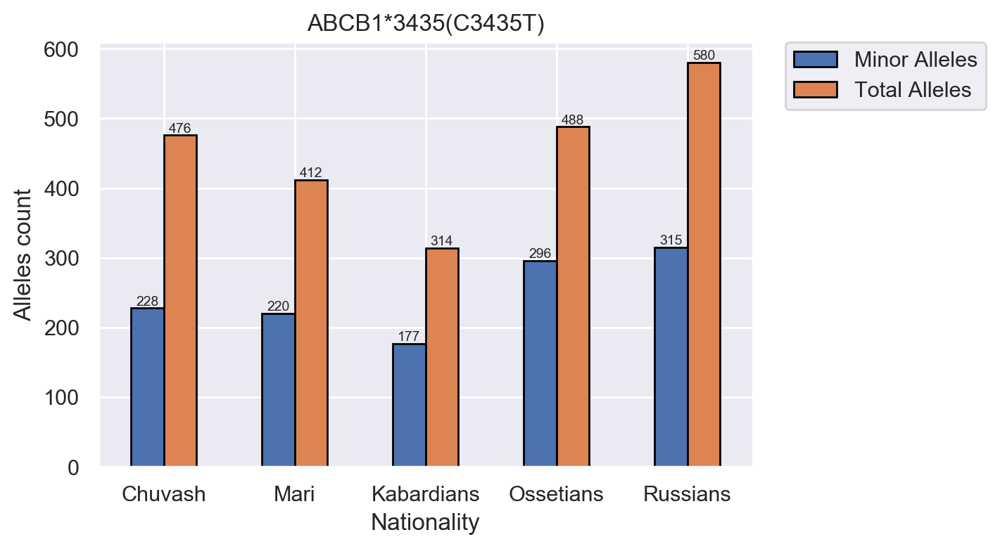

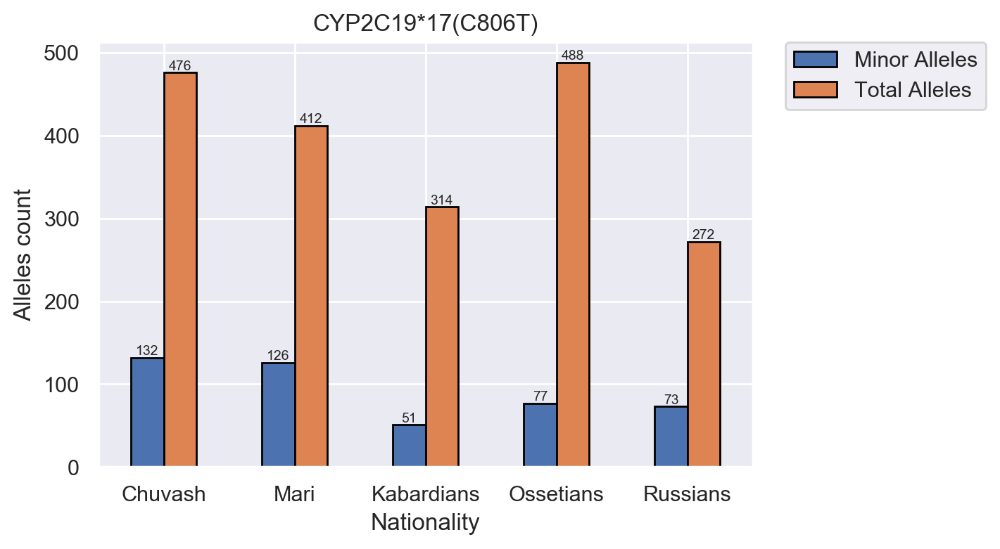

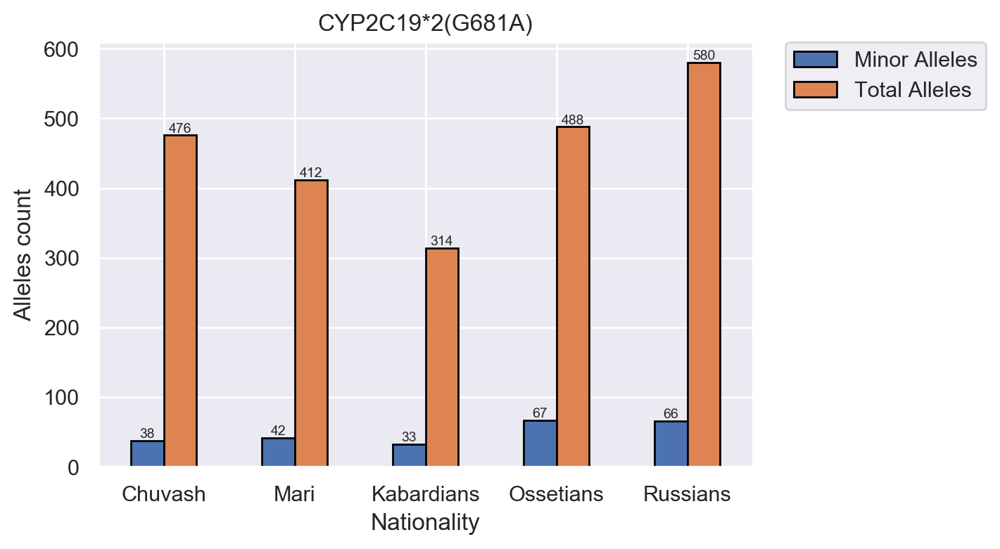

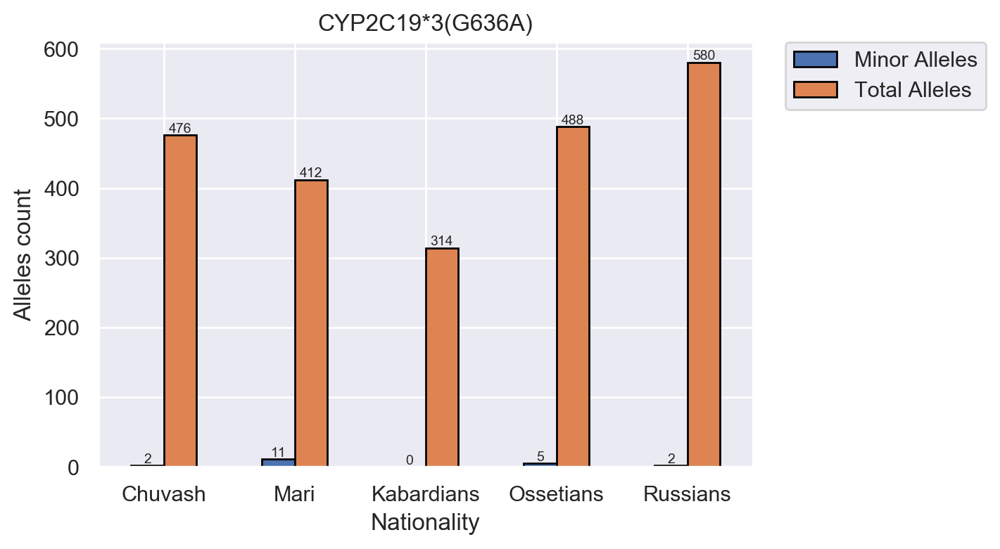

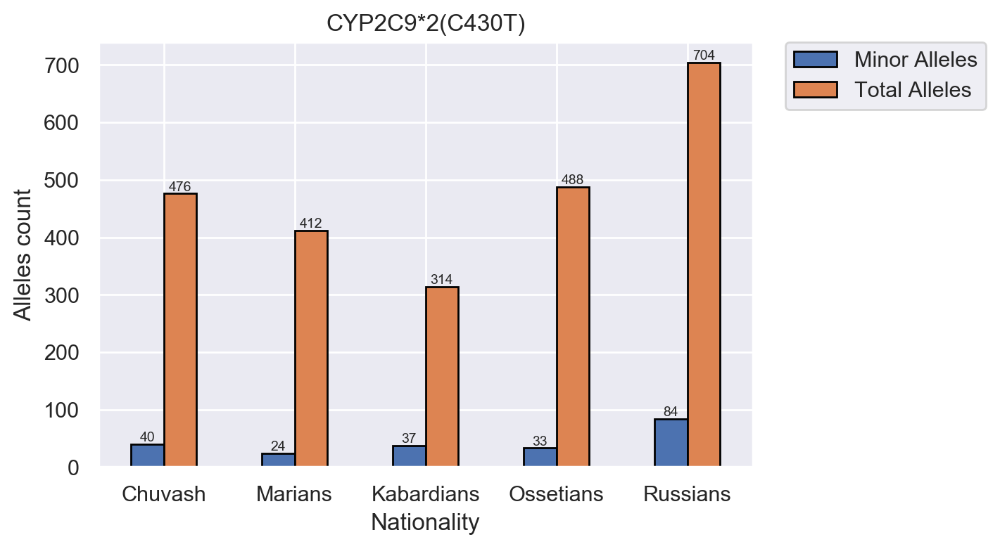

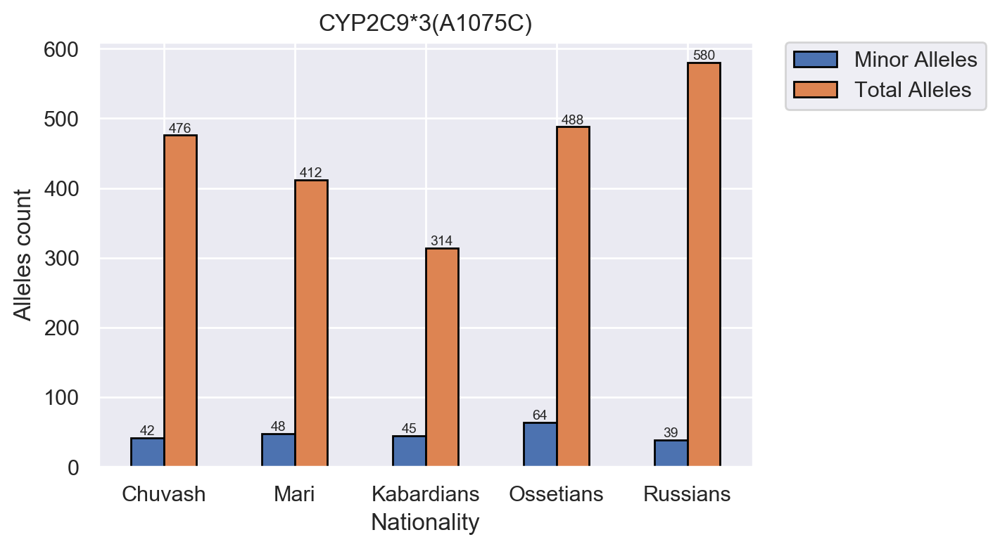

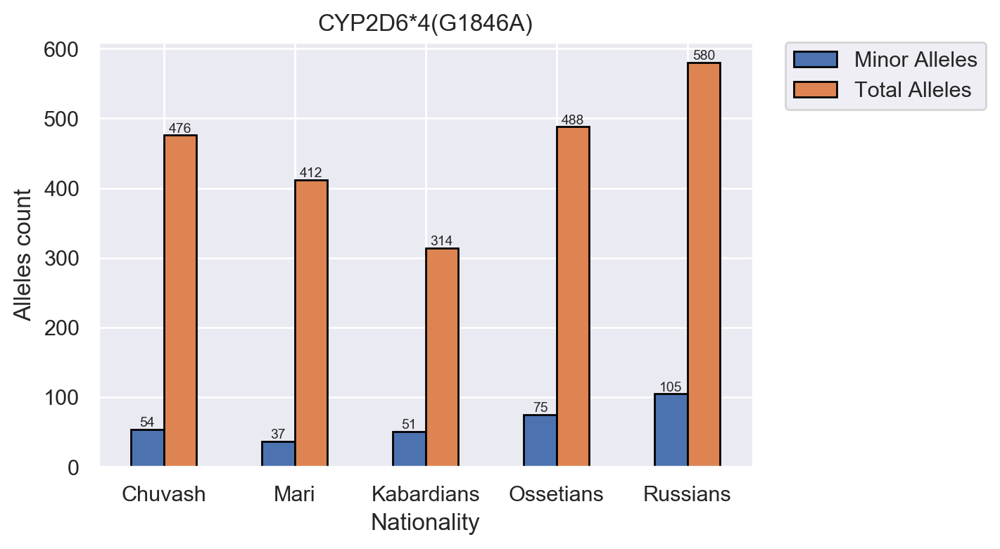

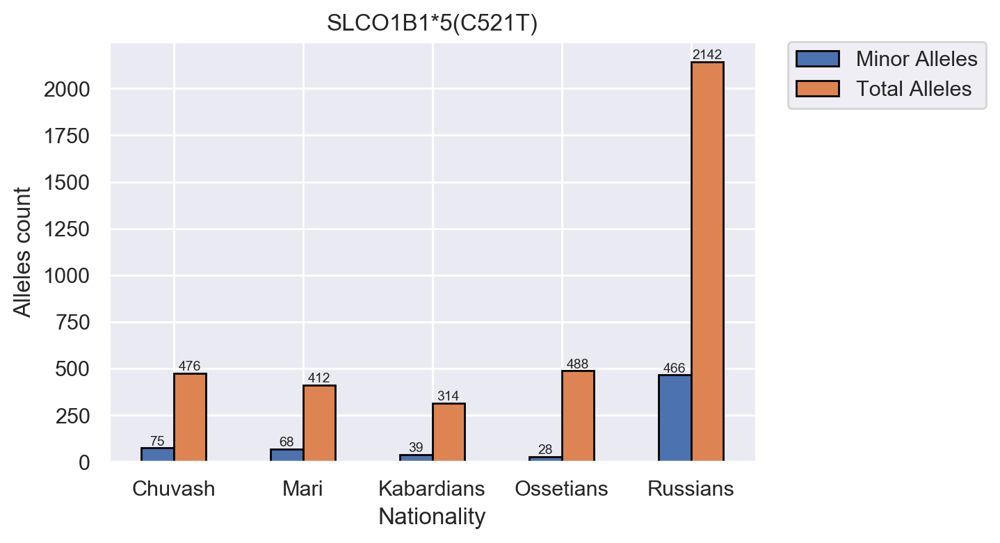

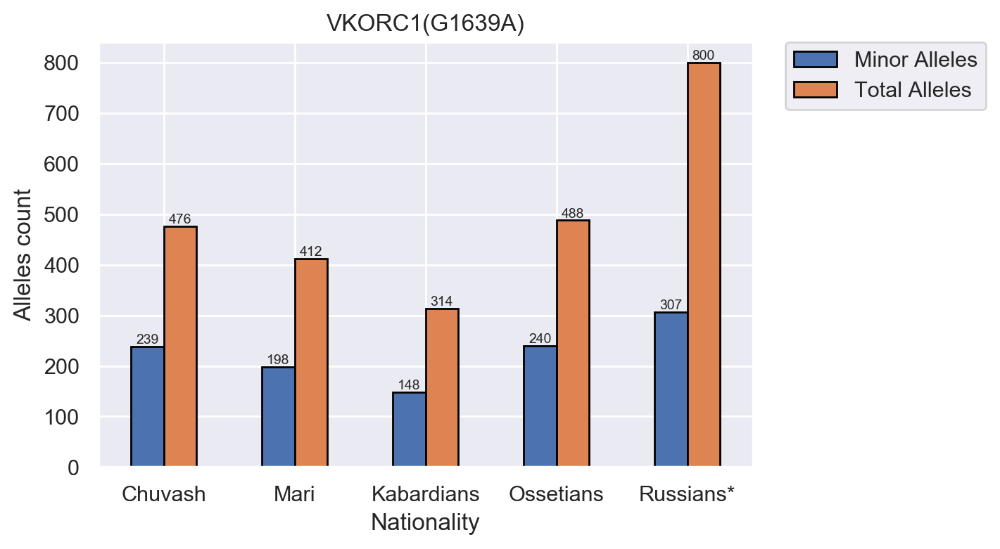

In [10]:
for value, group in df_allele_frequences.groupby('SNP'):
    chart = group[['Nationality', 'Minor Alleles', 'Total Alleles']].set_index(
        'Nationality').plot(kind='bar', edgecolor='black')
    for patch in chart.patches:
        bbox = patch.get_bbox()
        val = "{:.0f}".format(bbox.y1 + bbox.y0)
        chart.annotate(val, ((bbox.x0 + bbox.x1)/2, bbox.y1),
                       ha='center', va='bottom', fontsize=7)
    plt.xticks(rotation=0)
    plt.title(value)
    plt.ylabel('Alleles count')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

## Normalized allele frequences

/Users/alexandershein/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:3494: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



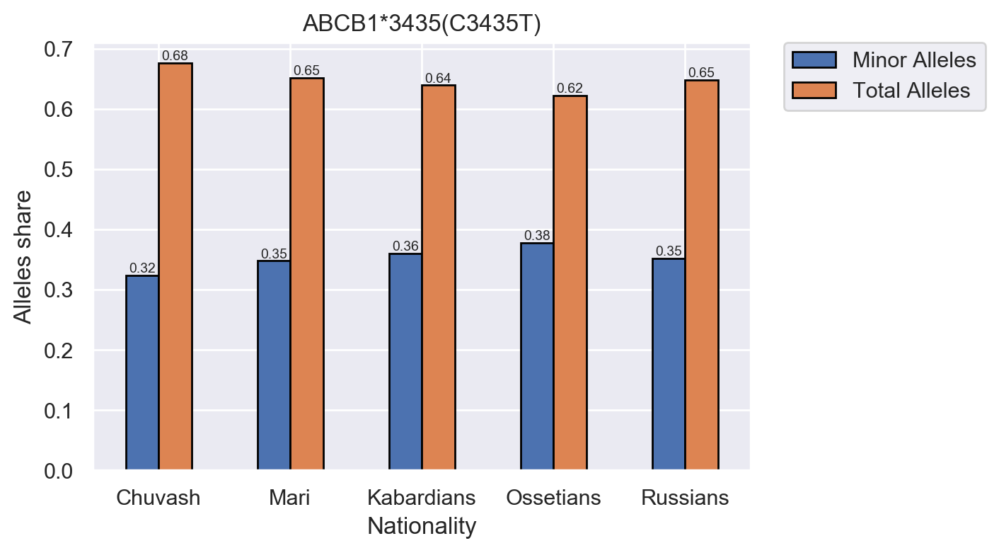

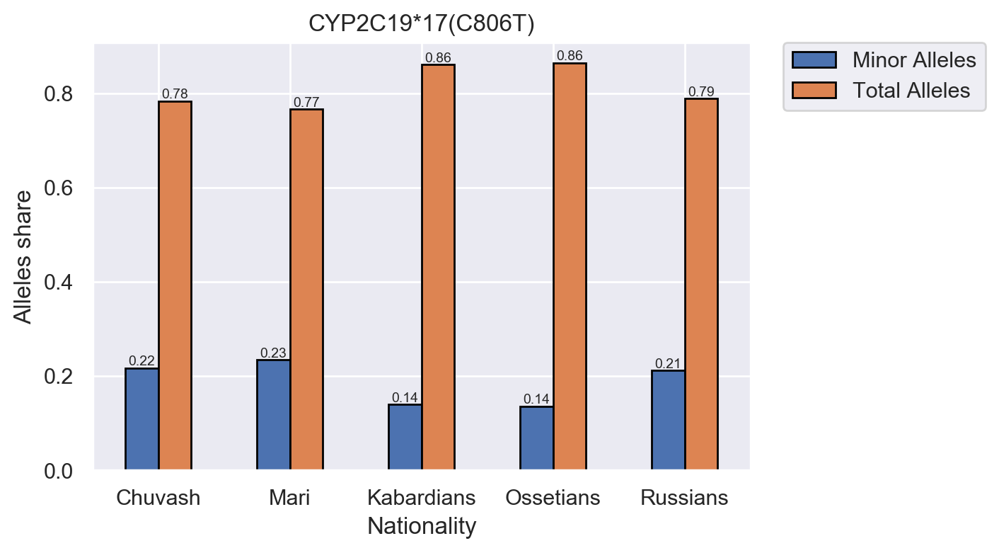

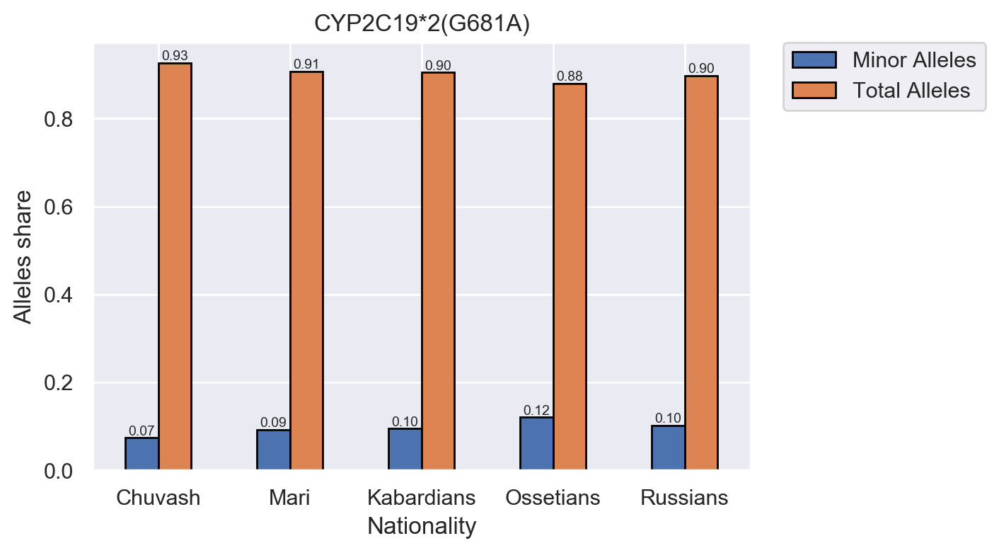

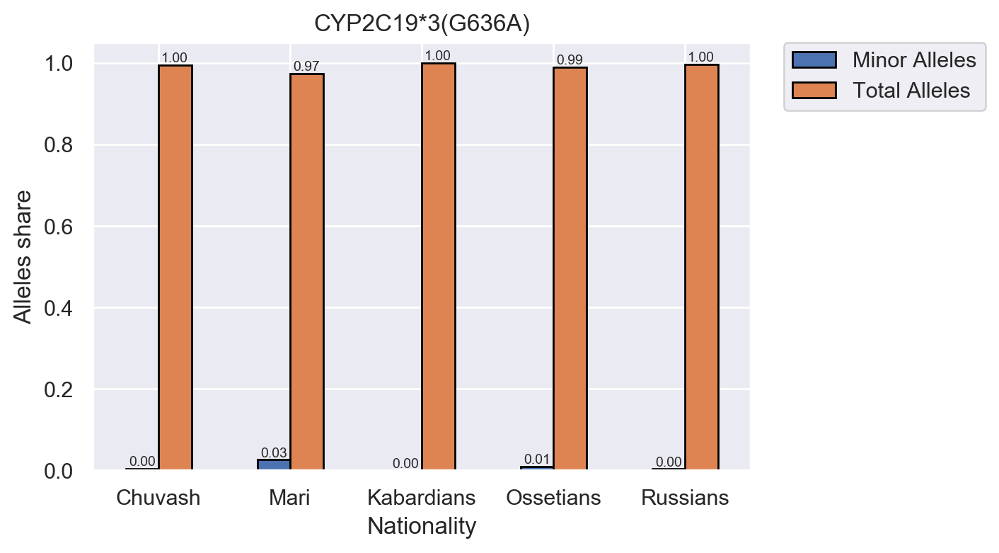

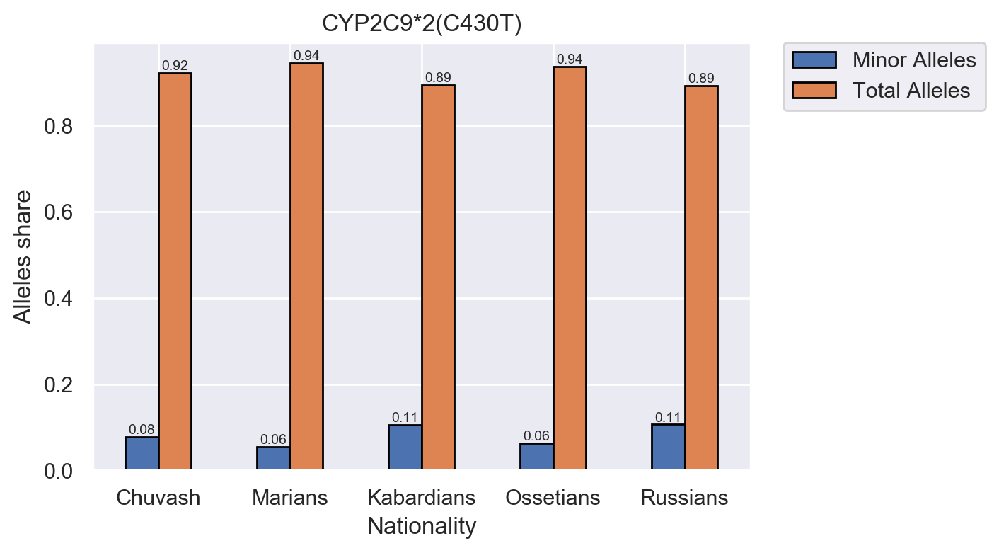

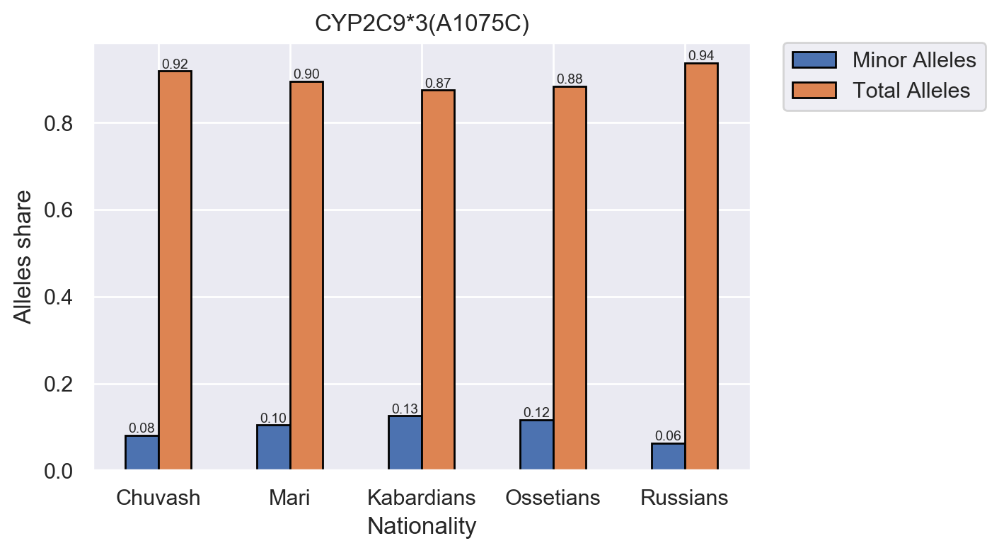

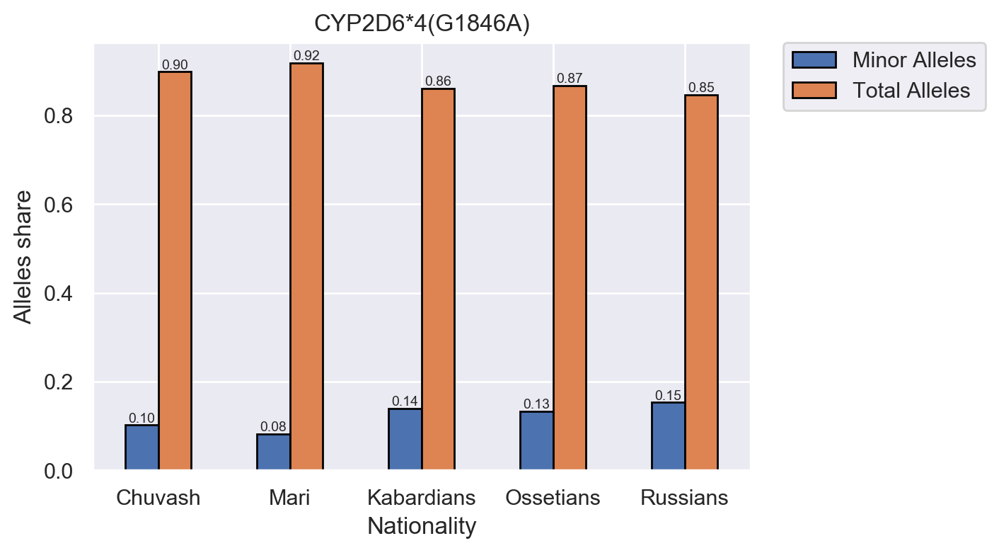

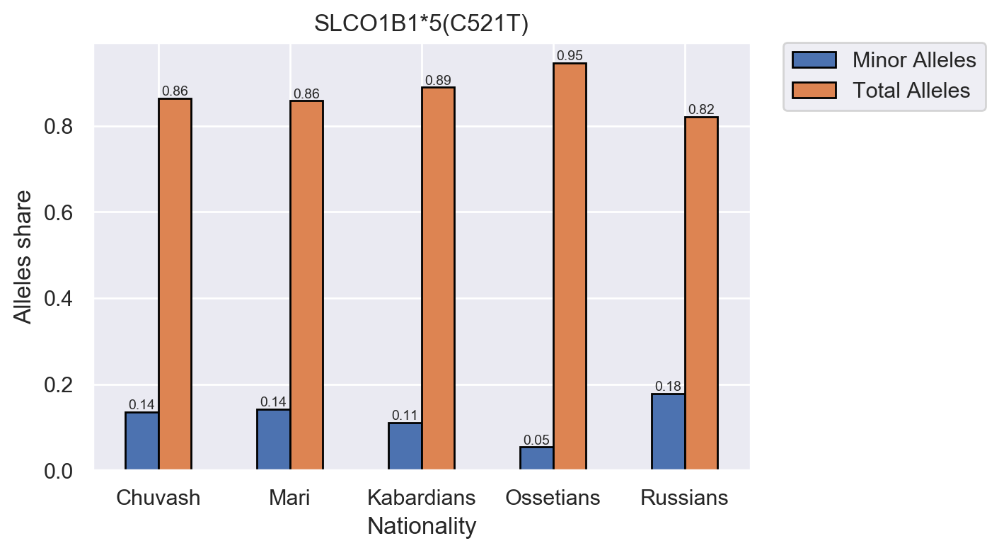

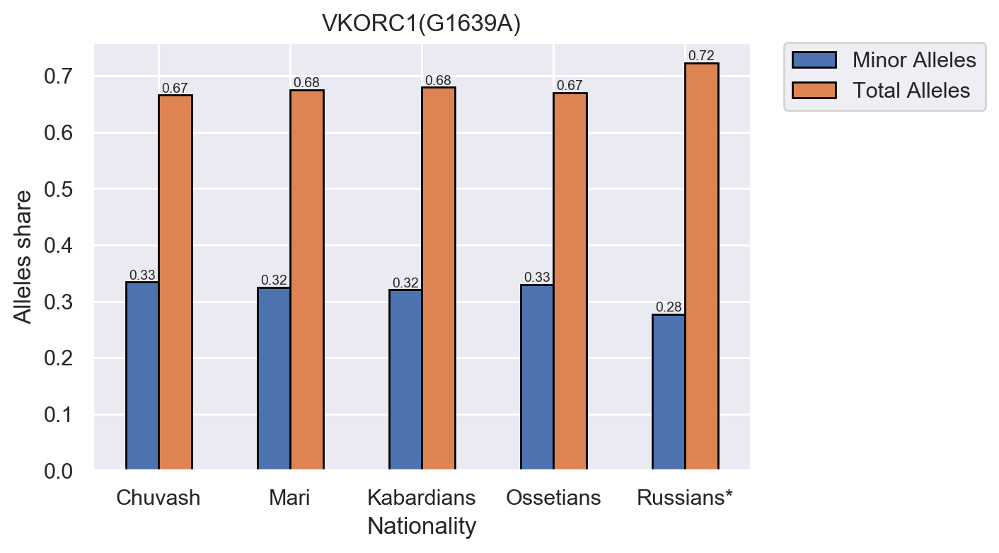

In [11]:
for value, group in df_allele_frequences.groupby('SNP'):
    group[['Minor Alleles', 'Total Alleles']] = group[['Minor Alleles', 'Total Alleles']].divide(
        group[['Minor Alleles', 'Total Alleles']].sum(axis=1), axis=0
    )
    chart = group[['Nationality', 'Minor Alleles', 'Total Alleles']].set_index(
        'Nationality').plot(kind='bar', edgecolor='black')
    for patch in chart.patches:
        bbox = patch.get_bbox()
        val = "{:.2f}".format(bbox.y1 + bbox.y0)
        chart.annotate(val, ((bbox.x0 + bbox.x1)/2, bbox.y1),
                       ha='center', va='bottom', fontsize=7)
    plt.xticks(rotation=0)
    plt.title(value)
    plt.ylabel('Alleles share')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

## Allele frequences pie charts

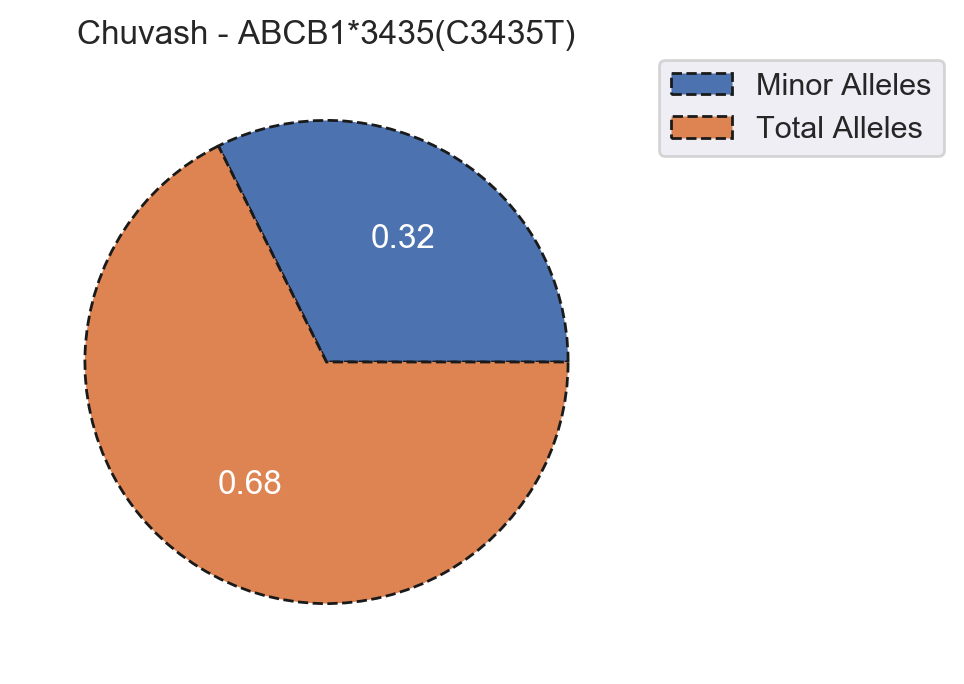

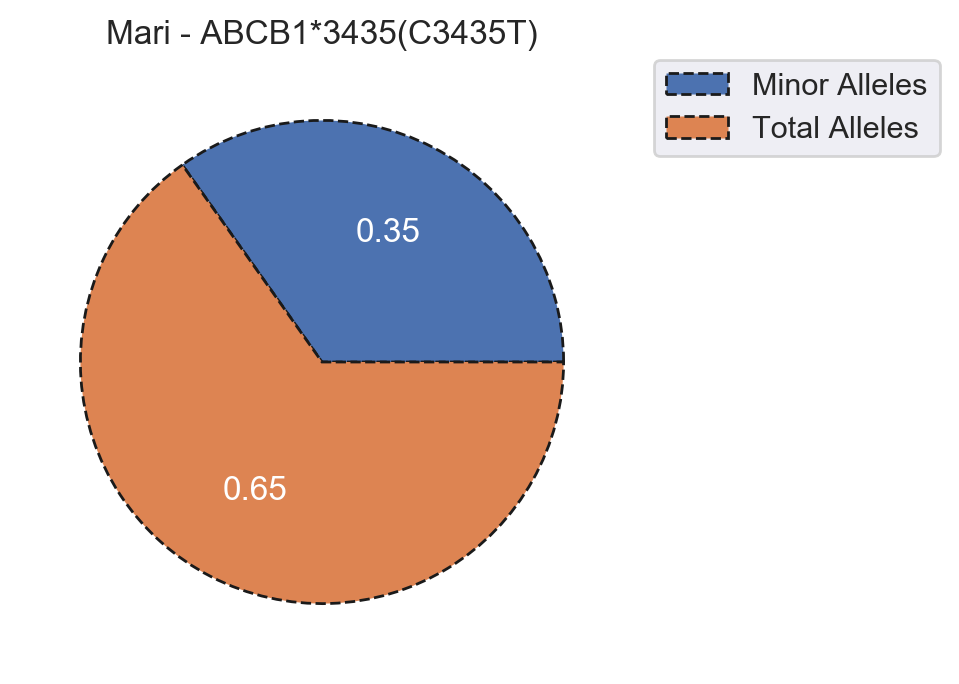

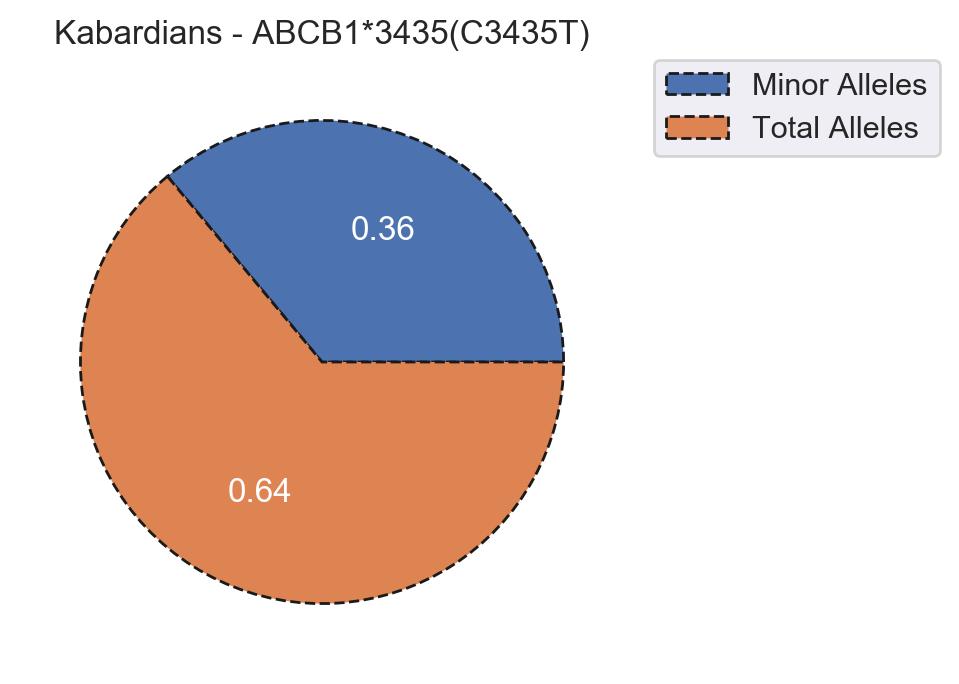

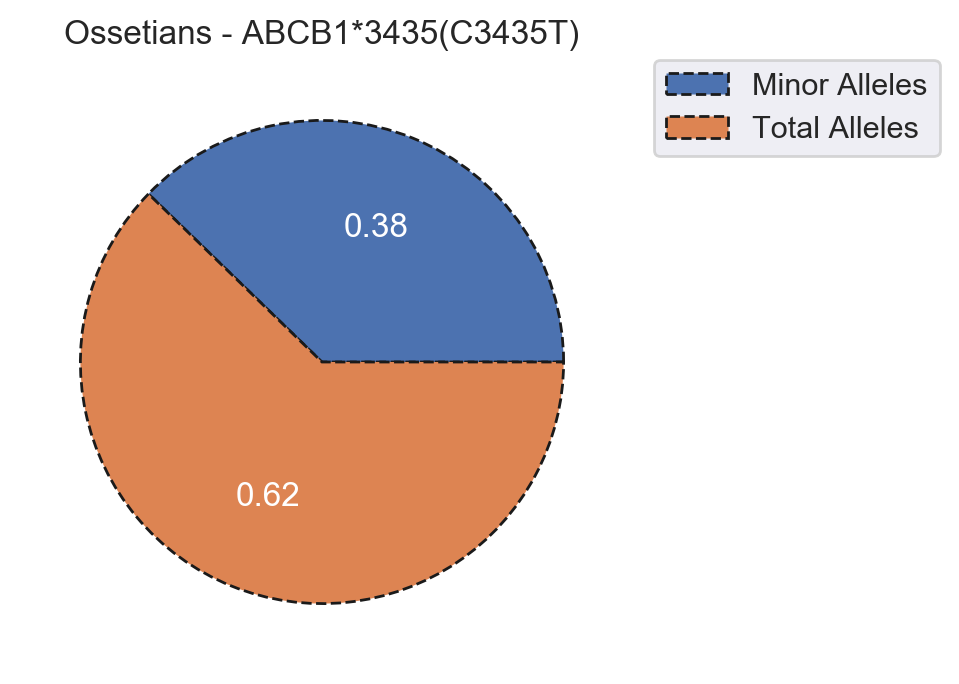

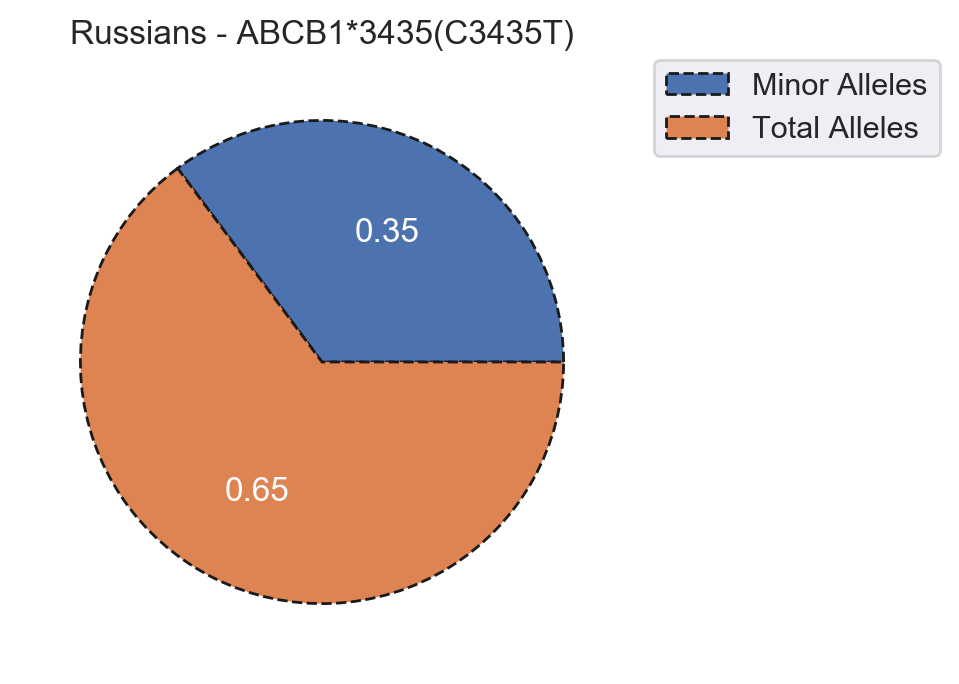

...

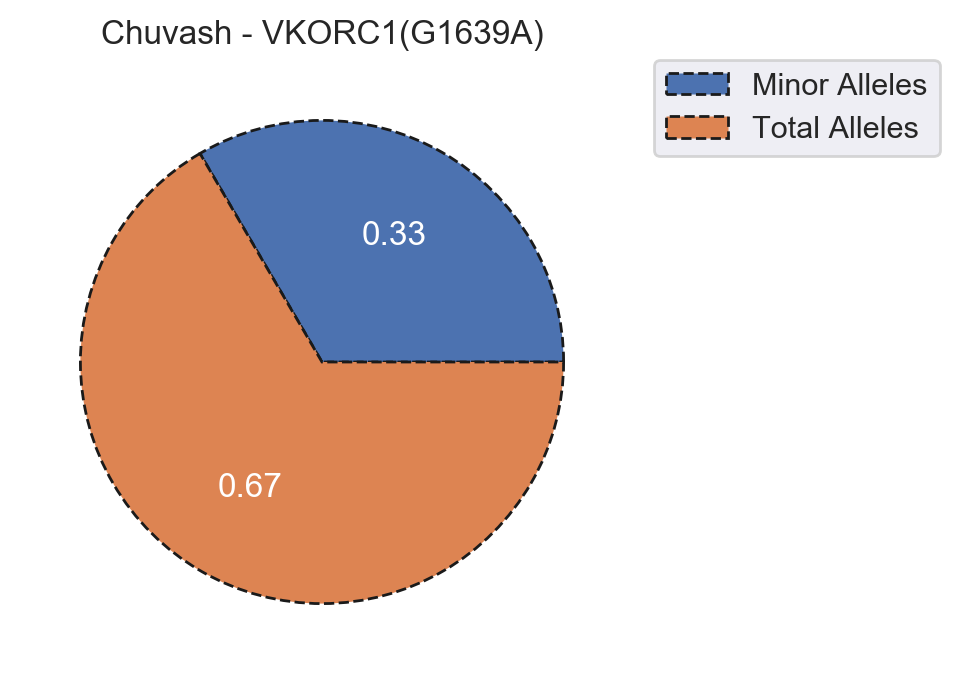

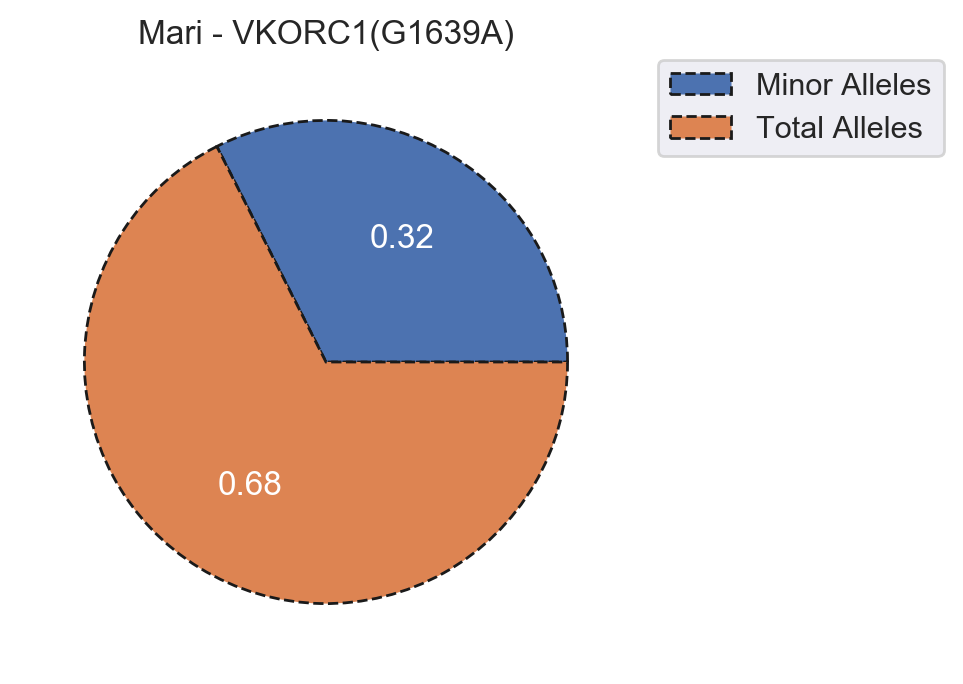

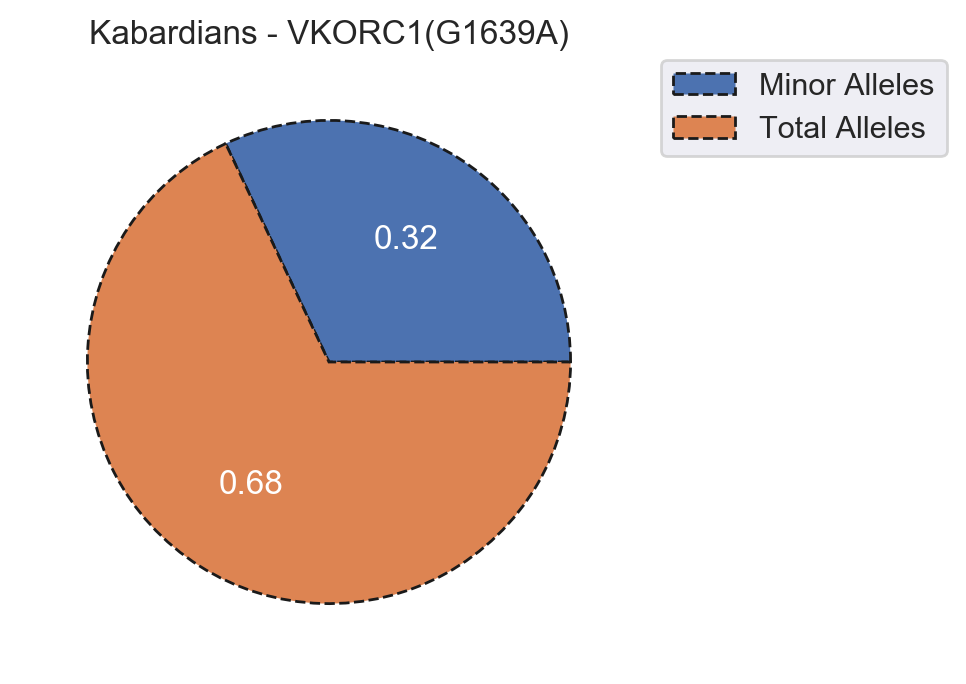

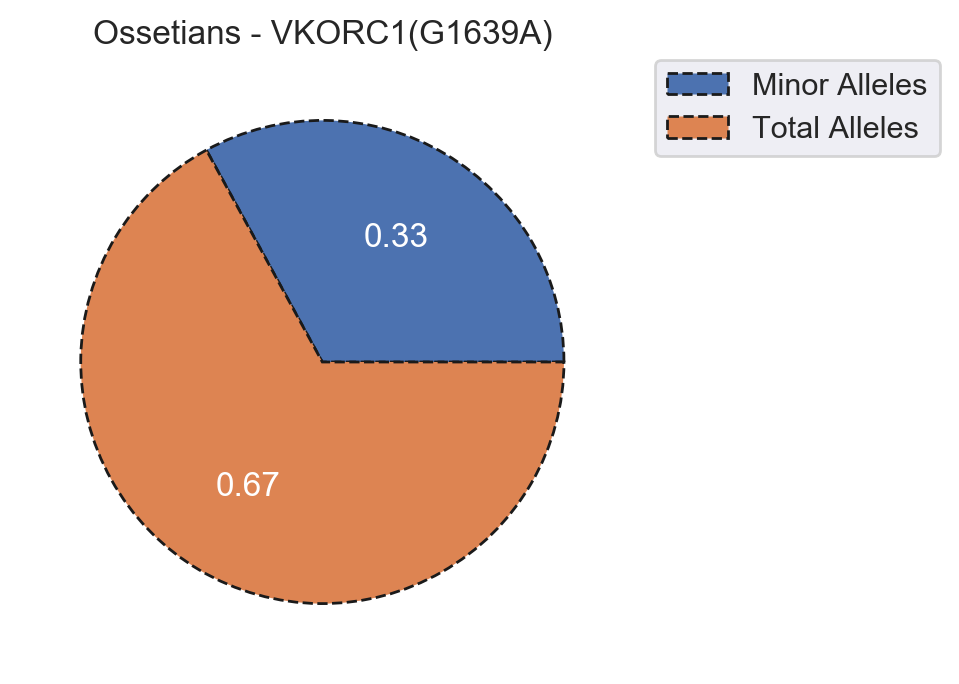

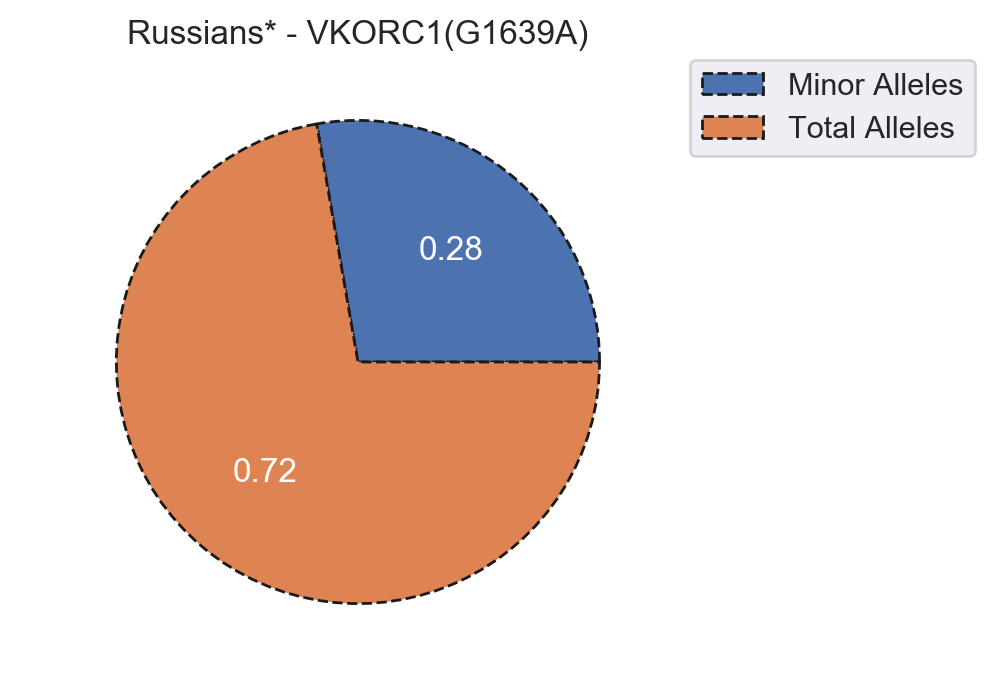

In [12]:
for value, group in df_allele_frequences.groupby('SNP'):
    processed_group = group[['Nationality', 'Minor Alleles',
                             'Total Alleles']].set_index('Nationality').T
    for col in processed_group.columns:
        chart = processed_group[col].plot(
            kind='pie', label='', autopct=lambda pct: f'{pct*.01:.2f}',
            textprops=dict(color="w"),
            wedgeprops={"edgecolor": "k", 'linewidth': 1,
                        'linestyle': 'dashed', 'antialiased': True}
        )
        plt.title(f'{col} - {value}')
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        plt.show()

## Haplotypes visualization

In [13]:
df_haplotypes_warfarin

,CYP2C9*2(C430Т),CYP2C9*3(A1075C),VKORC1(G1639A),Chuvash,Mari,Kabardians,Ossetians
0,C,A,G,0.39,0.43,0.38,0.40
1,C,A,A,0.44,0.40,0.38,0.41
2,C,C,A,0.03,0.06,0.07,0.08
3,C,C,G,0.06,0.06,0.06,0.05
4,T,A,G,0.05,0.03,0.07,0.06
5,T,A,A,0.04,0.03,0.03,0.01


In [14]:
df_haplotypes_warfarin[['Chuvash', 'Mari', 'Kabardians', 'Ossetians', ]].sum(axis=0)

Chuvash       1.01
Mari          1.01
Kabardians    0.99
Ossetians     1.01
dtype: float64

In [15]:
df_haplotypes_clopidrogel

,CYP2C19*2(G681A),CYP2C19*3(G636A),CYP2C19*17(C806T),ABCB1*3435(C435T),Chuvash,Mari,Kabardians,Ossetians
0,G,G,C,C,0.33,0.28,0.34,0.28
1,G,G,C,T,0.31,0.29,0.39,0.42
2,G,G,T,C,0.14,0.13,0.06,0.05
3,G,G,T,T,0.13,0.17,0.10,0.10
4,A,G,C,C,0.04,0.04,0.04,0.06
5,A,G,C,T,0.04,0.06,0.07,0.08


In [16]:
df_haplotypes_clopidrogel[['Chuvash', 'Mari', 'Kabardians', 'Ossetians', ]].sum(axis=0)

Chuvash       0.99
Mari          0.97
Kabardians    1.00
Ossetians     0.99
dtype: float64

### Warfarin

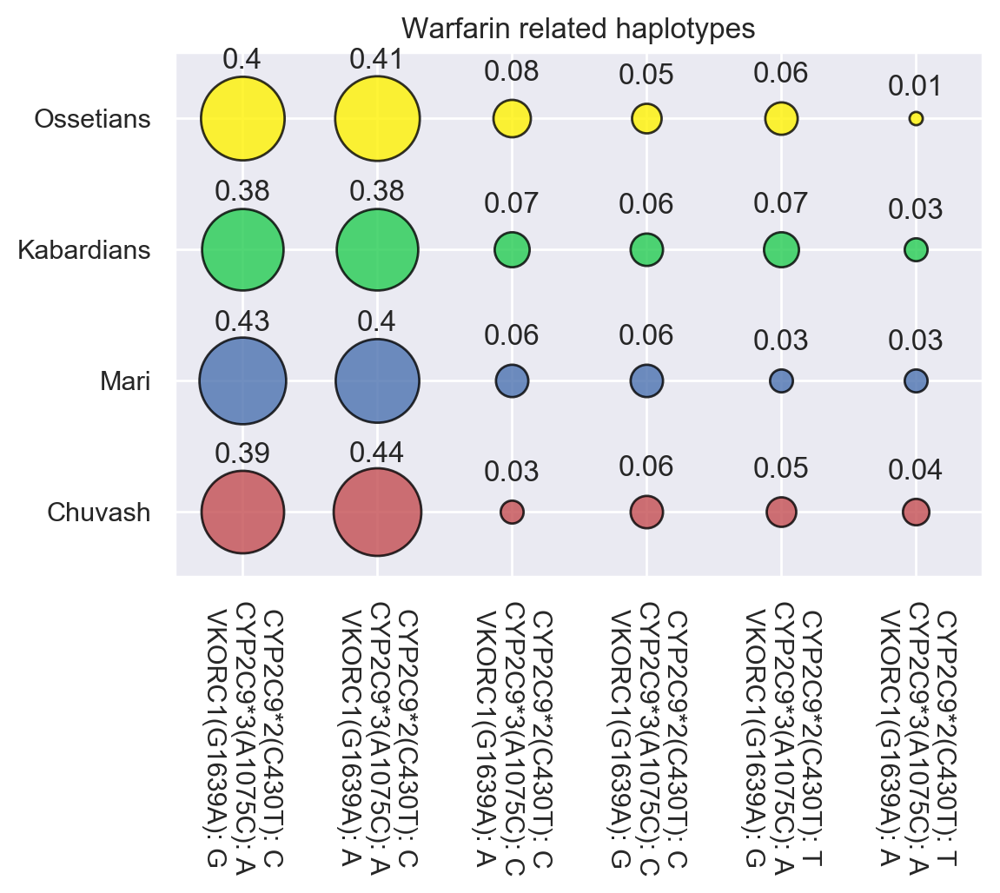

In [17]:
df_w = df_haplotypes_warfarin.copy()

df_frequences = df_w[['Chuvash', 'Mari', 'Kabardians', 'Ossetians', ]].T
df_haplotypes_w = df_w[[
    'CYP2C9*2(C430Т)', 'CYP2C9*3(A1075C)', 'VKORC1(G1639A)']]
nations = df_frequences.index.to_list()
labels = df_haplotypes_w.apply(lambda row: '\n'.join(
    [f'{col}: {row[col]}' for col in row.index]), axis=1)

X = np.arange(0, df_frequences.shape[1])
Y = np.arange(0, df_frequences.shape[0])

COLORS = {0: 'r', 1: 'b', 2: '#25cc52', 3: '#fff203'}
plt.ylim(-.5, 3.5)
plt.xlim(-.5, 5.5)
plt.xticks(X, labels, rotation=270)
plt.yticks(Y, nations)
plt.title('Warfarin related haplotypes')
# plt.legend(loc='center right', bbox_to_anchor=(1.25, 0.5), ncol=1)
for x in X:
    for y in Y:
        dot = plt.scatter(
            x, y, alpha=0.8, s=df_frequences.iloc[y, x]*3000, c=COLORS[y], linewidth=1, edgecolor='black'
        )
        plt.annotate(df_frequences.iloc[y, x], # this is the text
                     (x,y), # this is the point to label
                     textcoords="offset points", # how to position the text
                     xytext=(0,3*math.log(df_frequences.iloc[y, x]*1000)), # distance from text to points (x,y)
                     va='bottom',
                     ha='center') # horizontal alignment can be left, right or center

### Clopidrogel

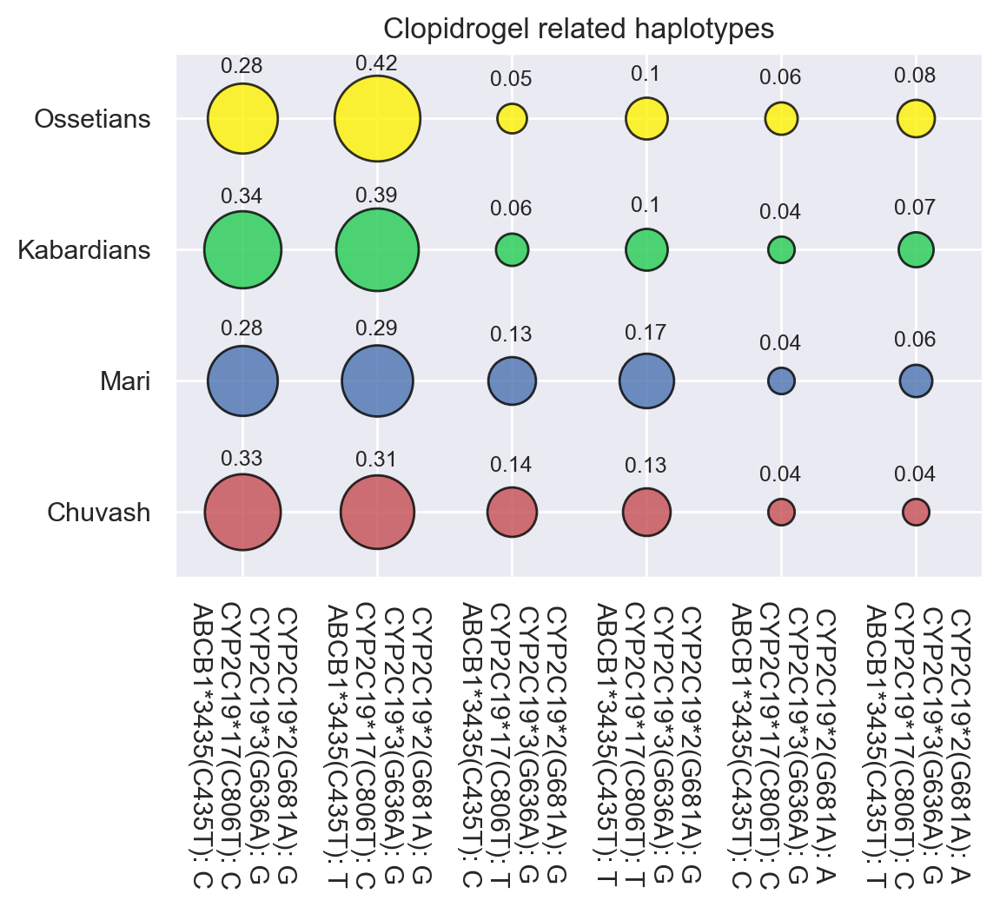

In [18]:
df_c = df_haplotypes_clopidrogel.copy()

df_frequences = df_c[['Chuvash', 'Mari', 'Kabardians', 'Ossetians', ]].T
df_haplotypes_c = df_c[['CYP2C19*2(G681A)', 'CYP2C19*3(G636A)', 'CYP2C19*17(C806T)', 'ABCB1*3435(C435T)']]
nations = df_frequences.index.to_list()
labels = df_haplotypes_c.apply(lambda row: '\n'.join(
    [f'{col}: {row[col]}' for col in row.index]), axis=1)

X = np.arange(0, df_frequences.shape[1])
Y = np.arange(0, df_frequences.shape[0])

COLORS = {0: 'r', 1: 'b', 2: '#25cc52', 3: '#fff203'}
plt.ylim(-.5, 3.5)
plt.xlim(-.5, 5.5)
plt.xticks(X, labels, rotation=270)
plt.yticks(Y, nations)
plt.title('Clopidrogel related haplotypes')
# plt.legend(loc='center right', bbox_to_anchor=(1.25, 0.5), ncol=1)
for x in X:
    for y in Y:
        plt.scatter(x, y, alpha=0.8, s=df_frequences.iloc[y,x]*3000, c=COLORS[y], linewidth=1, edgecolor='black')
        plt.annotate(df_frequences.iloc[y, x], # this is the text
                     (x,y), # this is the point to label
                     textcoords="offset points", # how to position the text
                     xytext=(0,3*math.log(df_frequences.iloc[y, x]*1000)), # distance from text to points (x,y)
                     va='bottom',
                     fontsize=9,
                     ha='center') # horizontal alignment can be left, right or center

### Warfarin pie charts

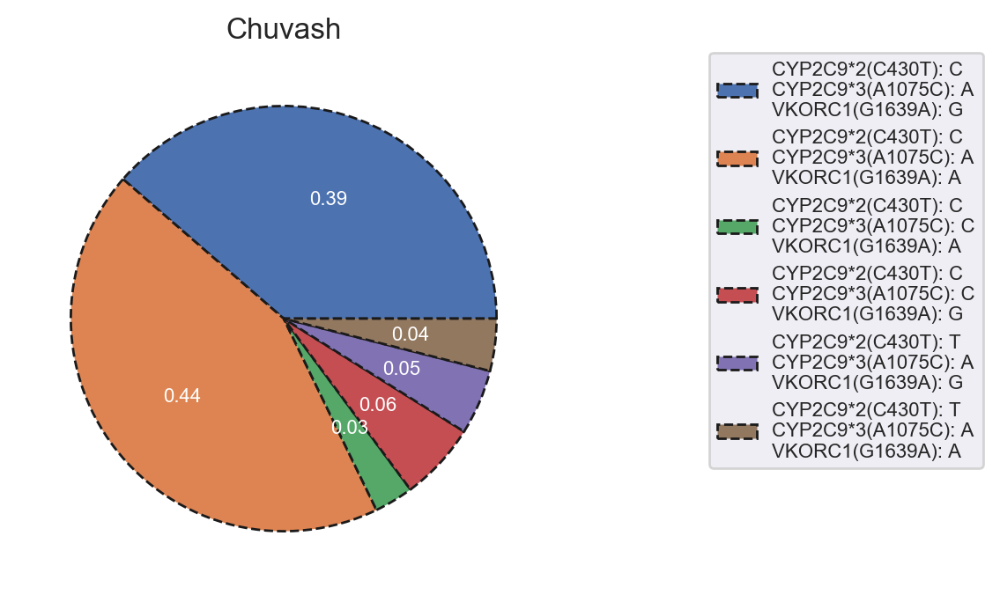

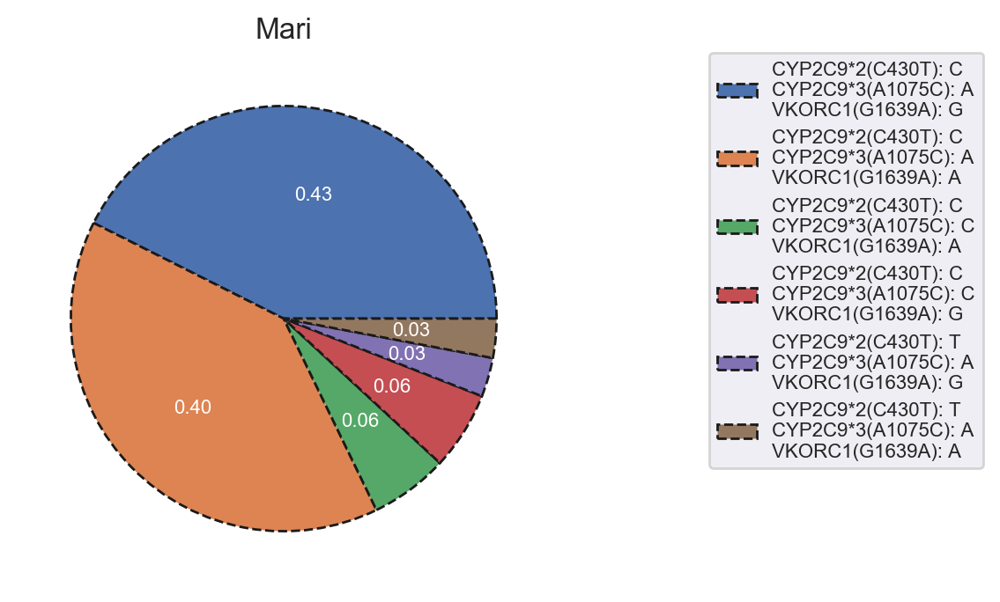

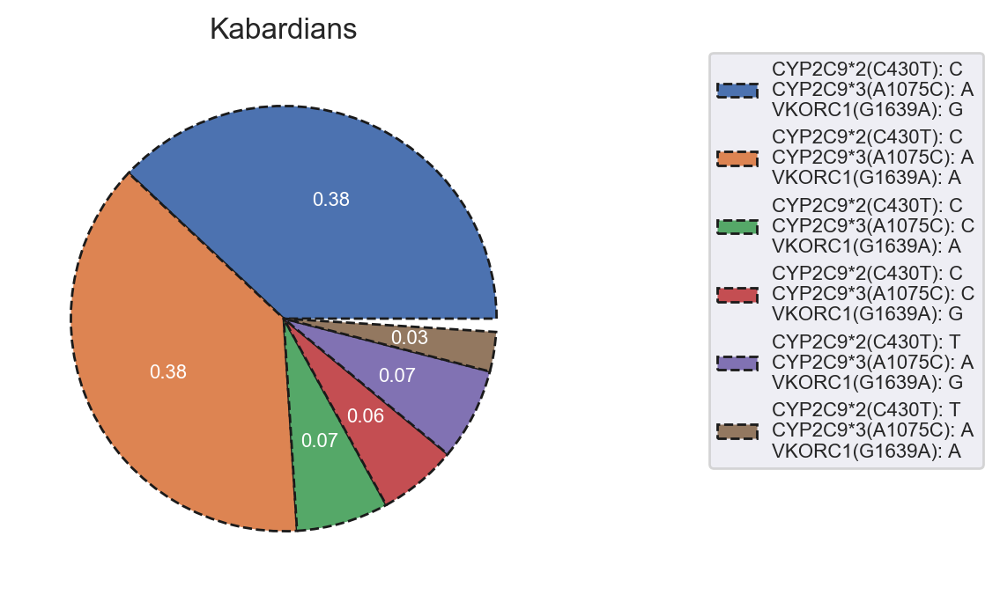

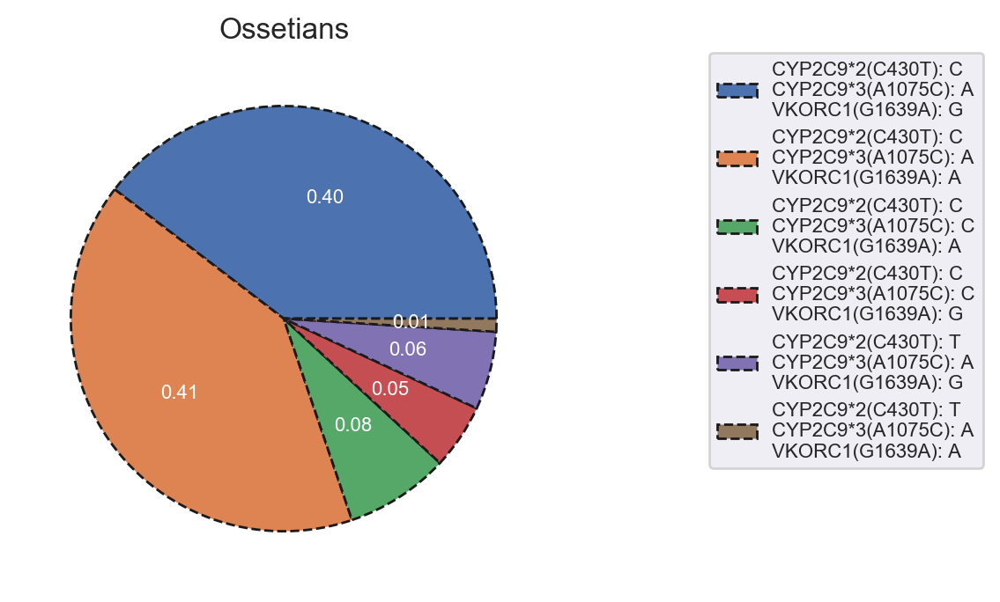

In [19]:
df_w = df_haplotypes_warfarin.copy()

df_frequences = df_w[['Chuvash', 'Mari', 'Kabardians', 'Ossetians', ]]
df_haplotypes_w = df_w[[
    'CYP2C9*2(C430Т)', 'CYP2C9*3(A1075C)', 'VKORC1(G1639A)']]
nations = df_frequences.columns.to_list()
labels = df_haplotypes_w.apply(lambda row: '\n'.join(
    [f'{col}: {row[col]}' for col in row.index]), axis=1)
df_frequences.index = labels
for col in df_frequences:
    plt.title(col)
    fig = df_frequences[col].plot(
        kind='pie',
        label='',
        labels=None,
        fontsize=8,
        autopct=lambda pct: f'{pct*.01:.2f}',
        textprops=dict(color="w"),
        wedgeprops={"edgecolor":"k",'linewidth': 1, 'linestyle': 'dashed', 'antialiased': True}

    )
    plt.legend(labels=df_frequences.index, bbox_to_anchor=(
        1.3, 1), loc=2, borderaxespad=0., fontsize=8)
    plt.show()

### Clopidrogel pie charts

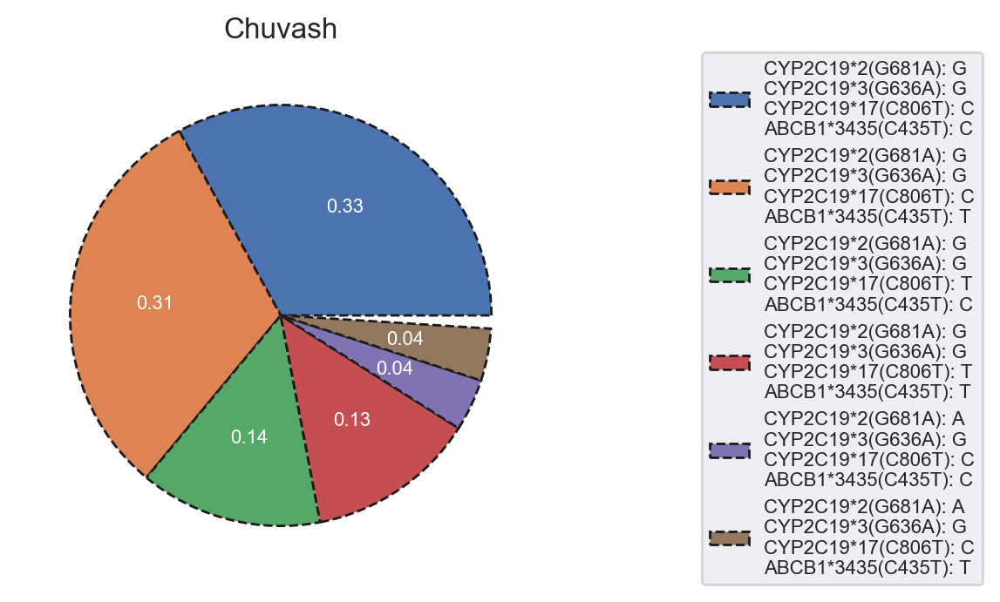

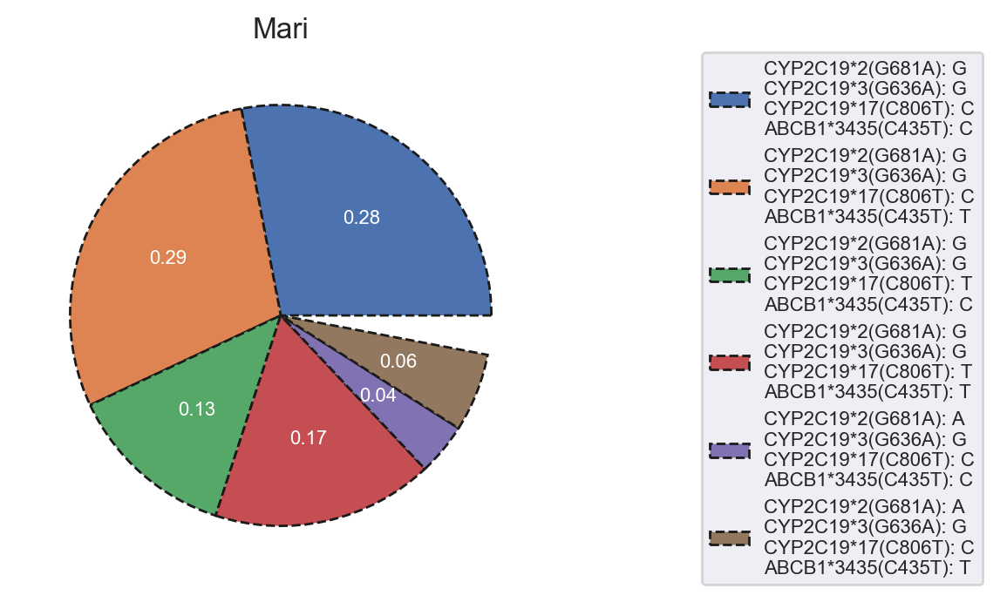

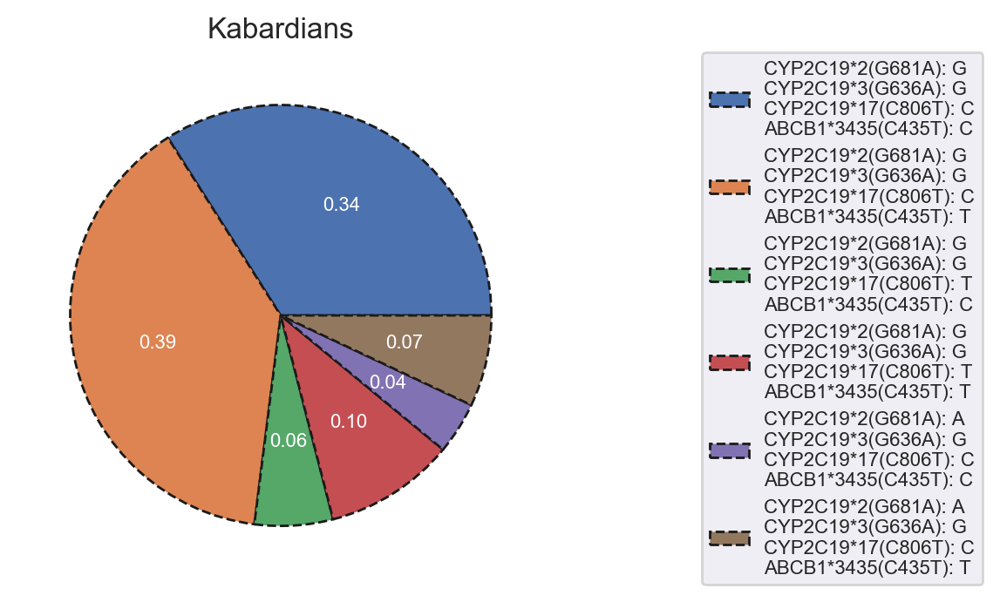

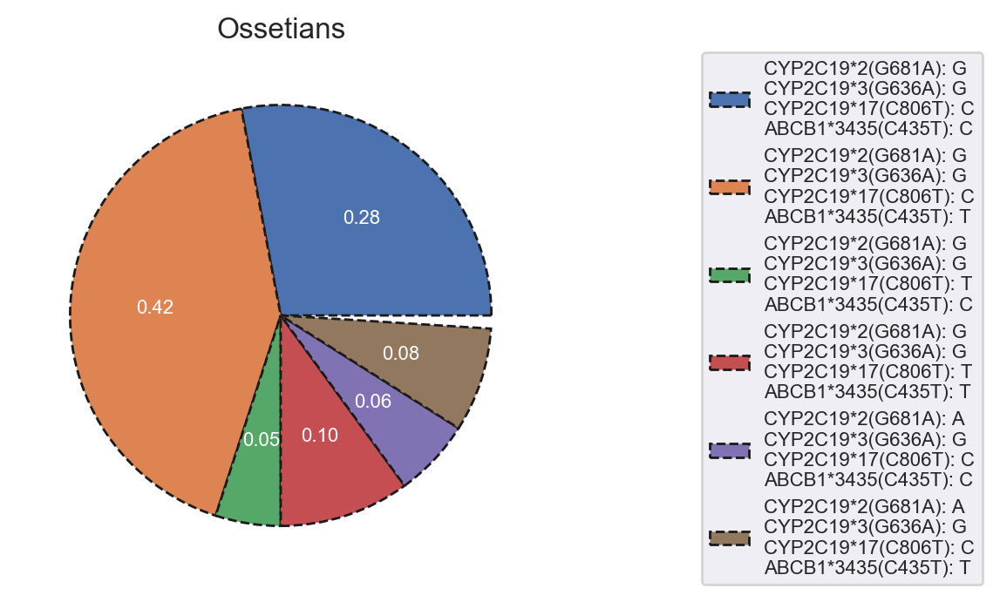

In [20]:
df_c = df_haplotypes_clopidrogel.copy()

df_frequences = df_c[['Chuvash', 'Mari', 'Kabardians', 'Ossetians', ]]
df_haplotypes_c = df_c[[
    'CYP2C19*2(G681A)', 'CYP2C19*3(G636A)', 'CYP2C19*17(C806T)', 'ABCB1*3435(C435T)']]
nations = df_frequences.columns.to_list()
labels = df_haplotypes_c.apply(lambda row: '\n'.join(
    [f'{col}: {row[col]}' for col in row.index]), axis=1)
df_frequences.index = labels

for col in df_frequences:
    plt.title(col)
    fig = df_frequences[col].plot(
        kind='pie',
        label='',
        labels=None,
        fontsize=8,
        autopct=lambda pct: f'{pct*.01:.2f}',
        textprops=dict(color="w"),
        wedgeprops={"edgecolor":"k",'linewidth': 1, 'linestyle': 'dashed', 'antialiased': True}
    )
    plt.legend(labels=df_frequences.index, bbox_to_anchor=(
        1.3, 1), loc=2, borderaxespad=0., fontsize=8)
    plt.show()

## Hardy-Weinberg predictions visualization

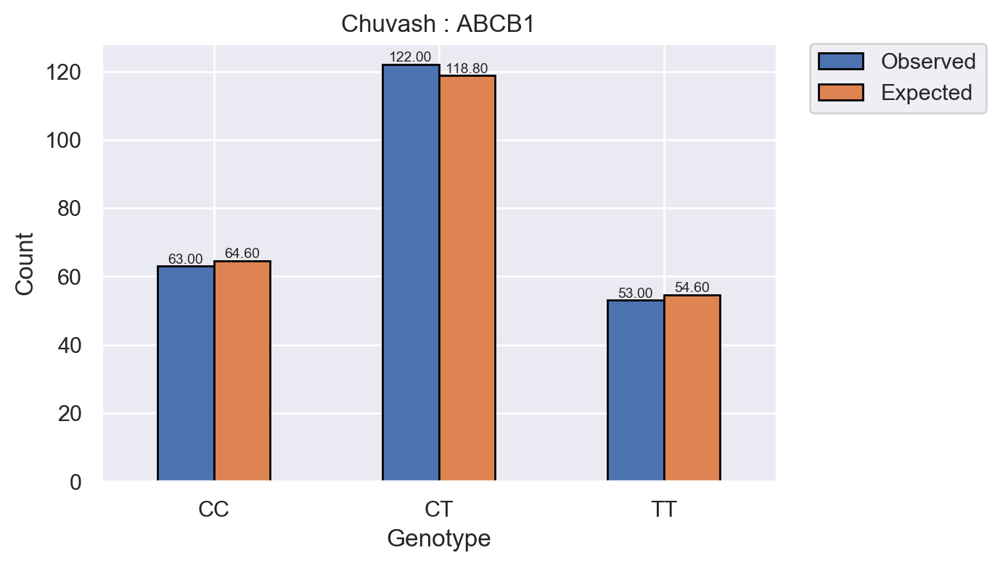

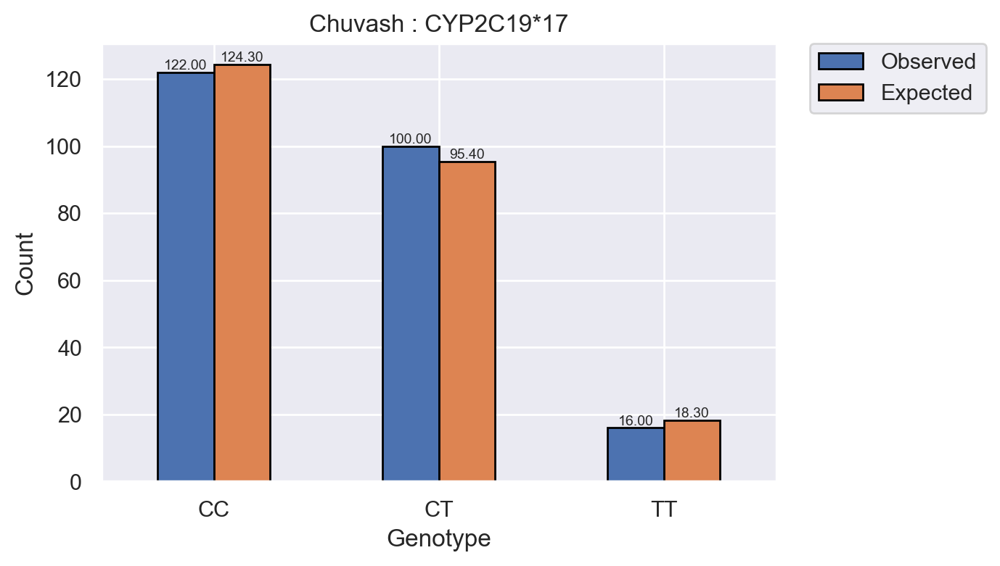

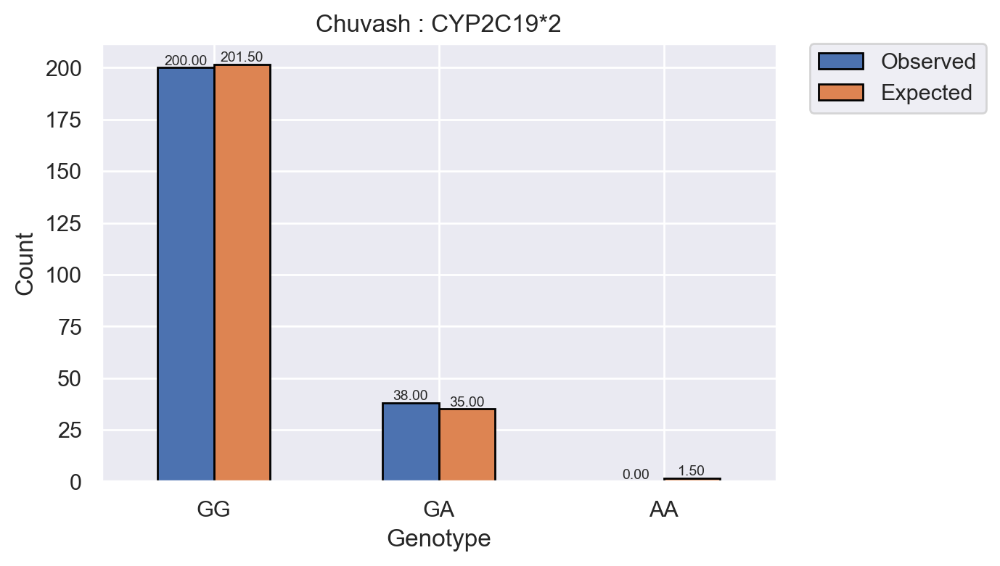

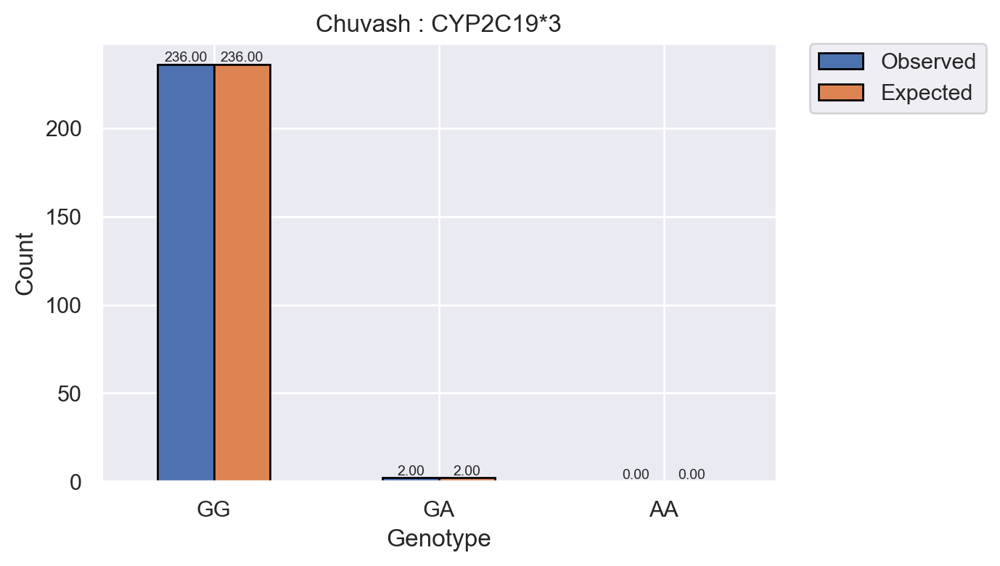

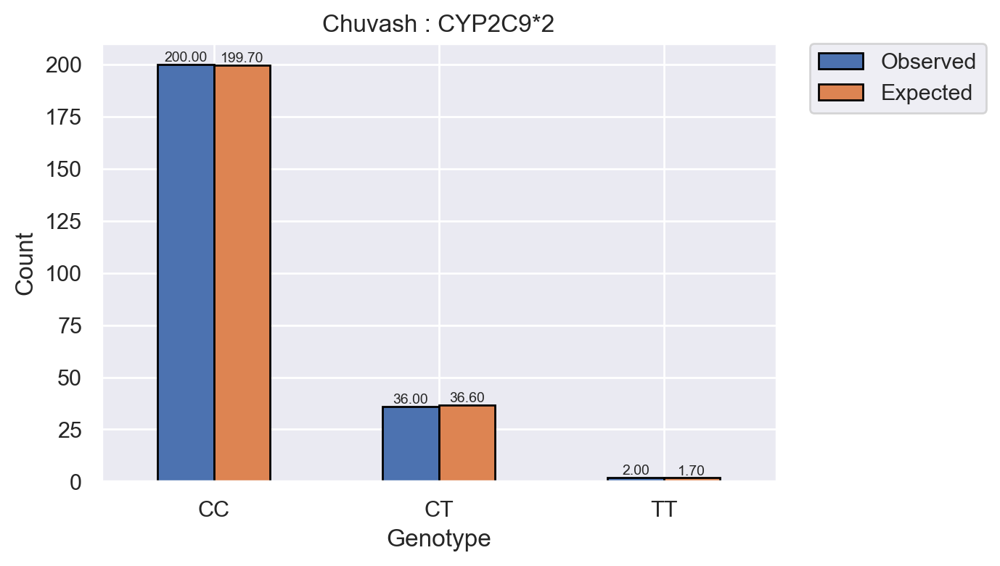

...

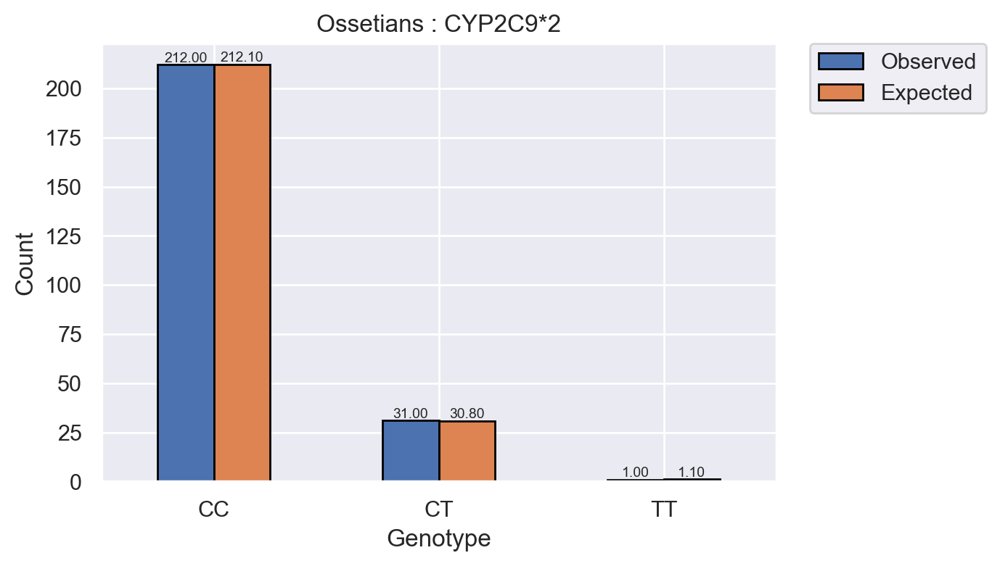

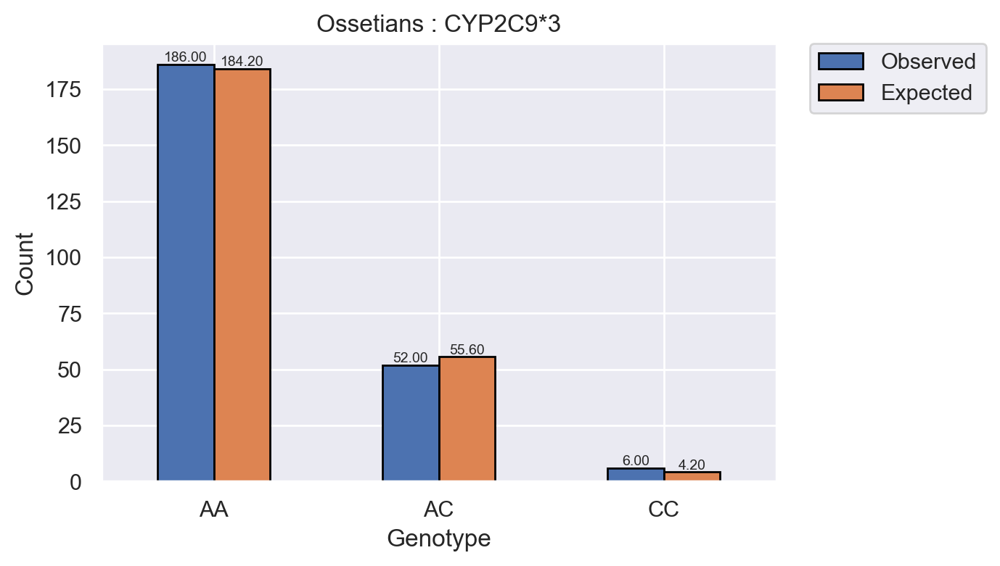

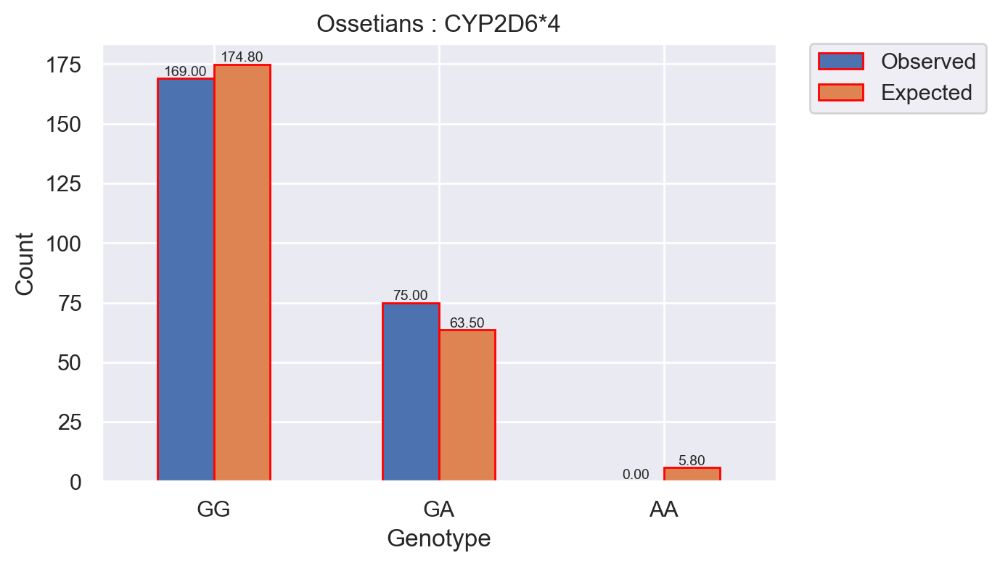

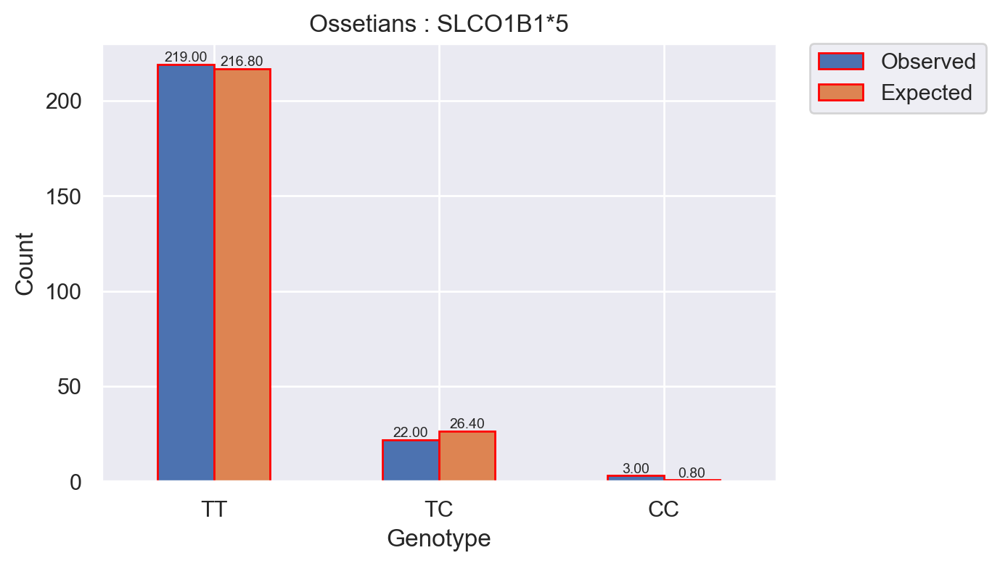

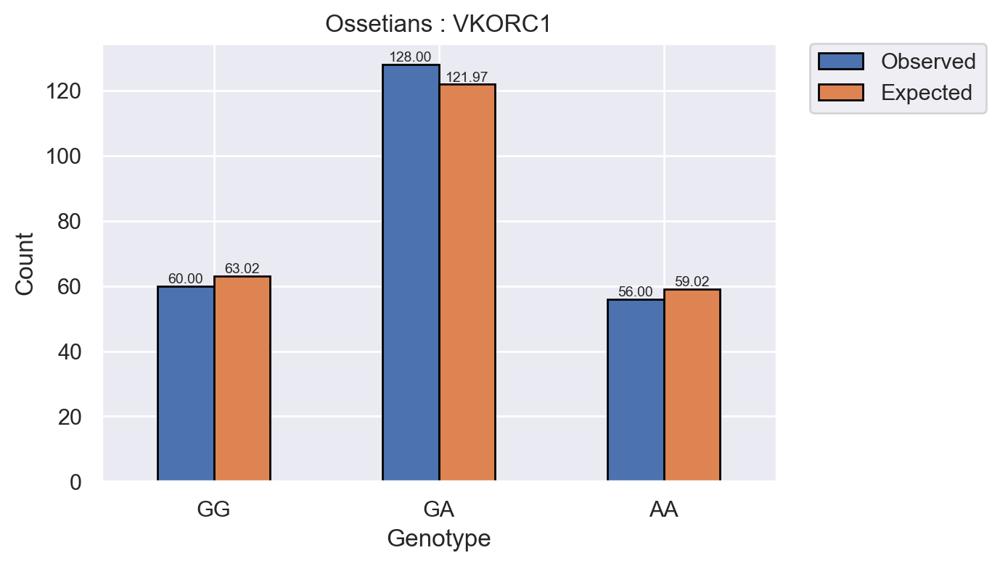

In [21]:
exp_obs_dfs = zip(['Chuvash', 'Mari', 'Kabardians', 'Ossetians', ], [
    df_exp_obs_chuvash,
    df_exp_obs_mari,
    df_exp_obs_kabardians,
    df_exp_obs_ossetians,
])
THRESHOLD = 0.05
for nation, exp_obs_df in exp_obs_dfs:
    for value, group in exp_obs_df.groupby('SNP'):
        group = group.set_index('Genotype')
        is_significant = group['p-value'][0] < THRESHOLD
        chart = group[['Observed', 'Expected']].plot(
            kind='bar', edgecolor=('red' if is_significant else 'black'), alpha=1,
        )
        for patch in chart.patches:
            bbox = patch.get_bbox()
            val = "{:.2f}".format(bbox.y1 + bbox.y0)
            chart.annotate(val, ((bbox.x0 + bbox.x1)/2, bbox.y1),
                           ha='center', va='bottom', fontsize=7)
        plt.xticks(rotation=0)
        plt.title(f'{nation} : {value}')
        plt.ylabel('Count')
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
        plt.show()

# Creating plots using plotly

## Batplots without normalization

In [23]:
bars = []
for col in merged_df.columns:
    if col != 'Nationality':
        gb = merged_df[[col, 'Nationality']].groupby(['Nationality', col]).size().unstack(fill_value=0)
        gb = gb.unstack().reset_index()
        gb.rename(columns={0: 'Count'}, inplace=True)
        fig = px.bar(gb, color='Nationality', y=col, x='Count', orientation='h', barmode='group',)
        fig.show()

## Batplots with normalization

In [24]:
bars = []
for col in merged_df.columns:
    if col != 'Nationality':
        gb = merged_df[[col, 'Nationality']].groupby(['Nationality', col]).size().unstack(fill_value=0)
        gb = gb.divide(gb.sum(axis=1), axis=0).unstack().reset_index()
        gb.rename(columns={0: 'Share'}, inplace=True)
        fig = px.bar(gb, color='Nationality', y=col, x='Share', orientation='h', barmode='group',)
        fig.show()
